In [34]:
# 9,CongestionWindow
# 17,SmoothedRTT
# 20,RetransmissionTimeout
# 21,SocketSendBufferSize
# 22,SocketSendBufferBytes
# 23,SocketReceiveBufferSize
# 24,SocketReceiveBufferBytes
# 25,UnacknowledgedBytes

# # With ECN and no ECN

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd
import matplotlib.pyplot as plt
# from gym import wrappers
# from gym import spaces
import math
import random
import re
import os
import sys
import seaborn as sns

# import gym
# import tensorflow as tf
# from tensorflow.keras import layers
col = ['Direction', 'Hash', 'Time', 'LocalIP', 'LocalPort', 'ForeignIP', 'ForeignPort', 'SlowStartThreshold', 'CongestionWindow', 'BandwidthControlledWindow', 'SendingWindow', 'ReceiveWindow', 'SendingWindowScalingFactor', 'ReceiveWindowScalingFactor', 'TCPFiniteStateMachine',
       'MaximumSegmentSize', 'SmoothedRTT', 'SACKEnabled', 'TCPFlags', 'RetransmissionTimeout', 'SocketSendBufferSize', 'SocketSendBufferBytes', 'SocketReceiveBufferSize', 'SocketReceiveBufferBytes', 'UnacknowledgedBytes', 'ReassemblyQueue', 'Flowid', 'Flowtype']


In [36]:
import re

def contains_1_or_2(input_string):
    if '2' in input_string:
        return 2
    elif '1' in input_string:
        return 1
    else:
        return 0

# Example usage:
test_string = "abc123xyz"
result = contains_1_or_2(test_string)
print("Result:", result)


Result: 2


In [37]:
# plt.rcParams.update({'figure.figsize':(8,6), 'figure.dpi':100, 'font.size':16})

In [38]:
def functionfilenameandpath(path='./', extension='.log'):
    filepaths = []
    filenames = []

    for root, _, files_list in os.walk(path):
        for file_name in files_list:
            if file_name.endswith(extension):
                file_name_path = os.path.join(root, file_name)
                filenames.append(file_name)
                filepaths.append(file_name_path)

    return filenames, filepaths

In [39]:
folderpath="./datatest1"
filenames,filepaths=functionfilenameandpath(folderpath,'.log')

filepaths.sort()
filenames.sort()
print(filenames)

['codel_10Mbps_20ms_ecn.siftr.log', 'codel_10Mbps_20ms_noecn.siftr.log', 'codel_1Mbps_20ms_ecn.siftr.log', 'codel_1Mbps_20ms_noecn.siftr.log', 'fq_codel_10Mbps_20ms_ecn.siftr.log', 'fq_codel_10Mbps_20ms_noecn.siftr.log', 'fq_codel_1Mbps_20ms_ecn.siftr.log', 'fq_codel_1Mbps_20ms_noecn.siftr.log', 'fq_pie_10Mbps_20ms_ecn.siftr.log', 'fq_pie_10Mbps_20ms_noecn.siftr.log', 'fq_pie_1Mbps_20ms_ecn.siftr.log', 'fq_pie_1Mbps_20ms_noecn.siftr.log', 'l4s_10Mbps_20ms_ecn.siftr.log', 'l4s_10Mbps_20ms_noecn.siftr.log', 'l4s_1Mbps_20ms_ecn.siftr.log', 'l4s_1Mbps_20ms_noecn.siftr.log', 'pie_10Mbps_20ms_ecn.siftr.log', 'pie_10Mbps_20ms_noecn.siftr.log', 'pie_1Mbps_20ms_ecn.siftr.log', 'pie_1Mbps_20ms_noecn.siftr.log']


In [40]:
# for index in range(len(filenames)):
#     print("..................>>>>>>>>>>>>>>>>>")
#     print(filenames[index])
#     print(contains_1_or_2(filenames[index]))
#     print("..................>>>>>>>>>>>>>>>>>")

In [41]:
def remove_outliers_iqr(df, column_name):
    """
    Remove outliers from a specified column in a DataFrame using the IQR method.
    
    Parameters:
    df (pd.DataFrame): The DataFrame.
    column_name (str): The name of the column from which to remove outliers.
    
    Returns:
    pd.DataFrame: The DataFrame with outliers removed.
    """
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    return df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

codel_10Mbps_20ms_ecn.siftr.log
count    8011.000000
mean        0.155254
std         0.027579
min         0.000000
25%         0.135937
50%         0.150000
75%         0.173125
max         0.379688
Name: SmoothedRTT, dtype: float64
13303    0.000000
13366    0.379688
13385    0.379688
13451    0.347500
13452    0.347500
Name: SmoothedRTT, dtype: float64
43504    0.295312
43505    0.295312
43561    0.273438
43563    0.273438
43564    0.273438
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/codel_10Mbps_20ms_ecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


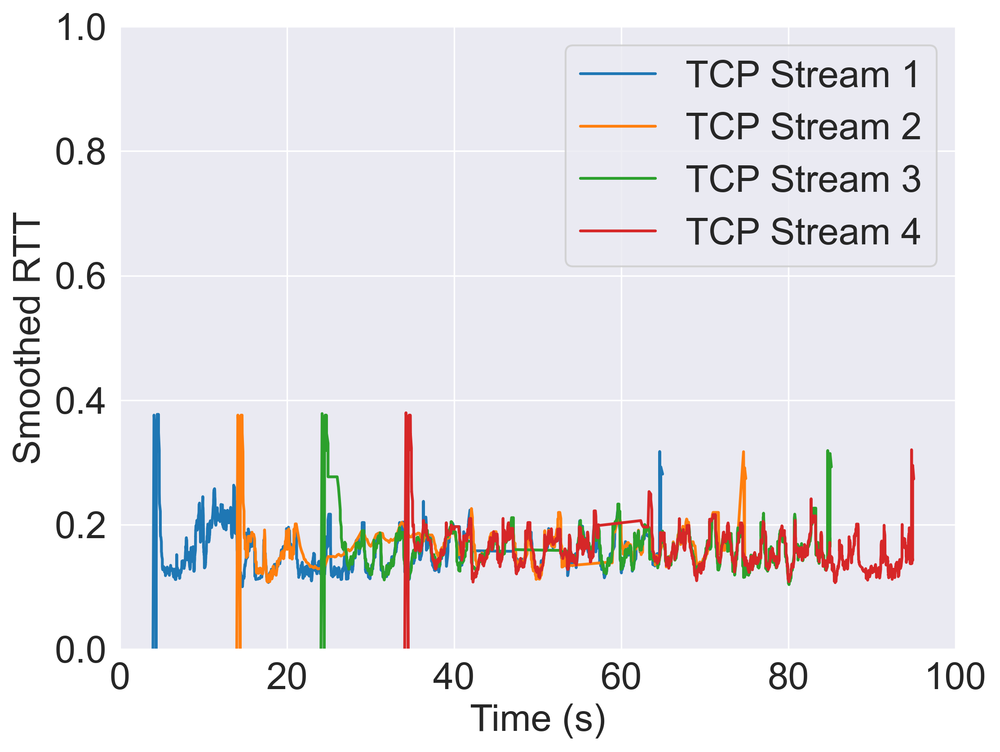

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


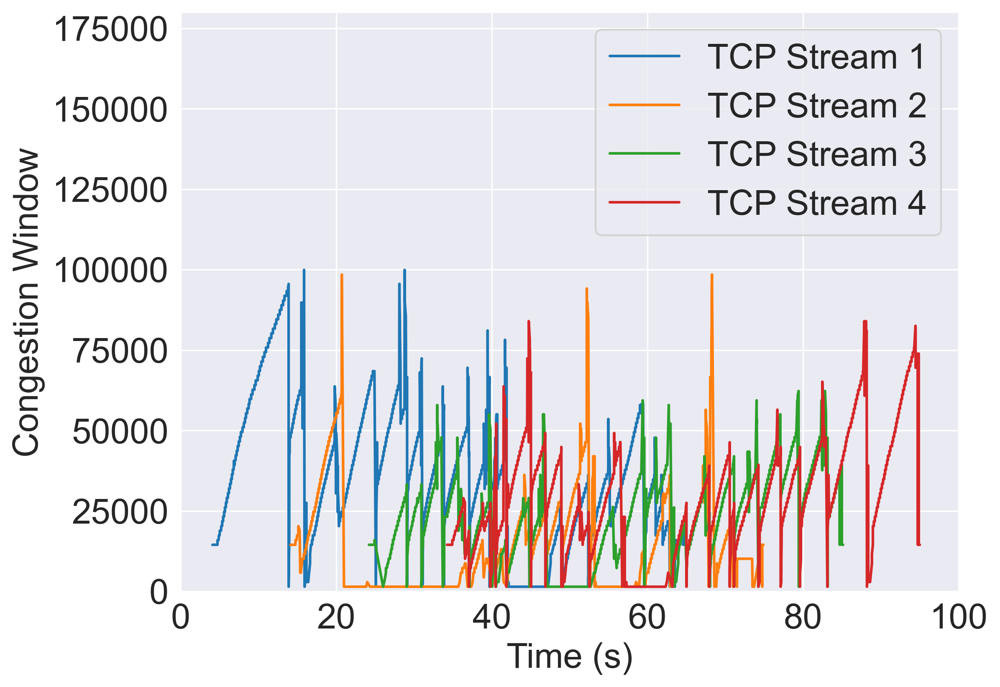

codel_10Mbps_20ms_noecn.siftr.log
count    9220.000000
mean        0.153583
std         0.025094
min         0.000000
25%         0.136875
50%         0.150625
75%         0.166250
max         0.249375
Name: SmoothedRTT, dtype: float64
14927    0.000000
15021    0.207500
15022    0.207500
15106    0.199063
15107    0.199063
Name: SmoothedRTT, dtype: float64
48513    0.180312
48514    0.180312
48568    0.177813
48570    0.177813
48571    0.177813
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/codel_10Mbps_20ms_noecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


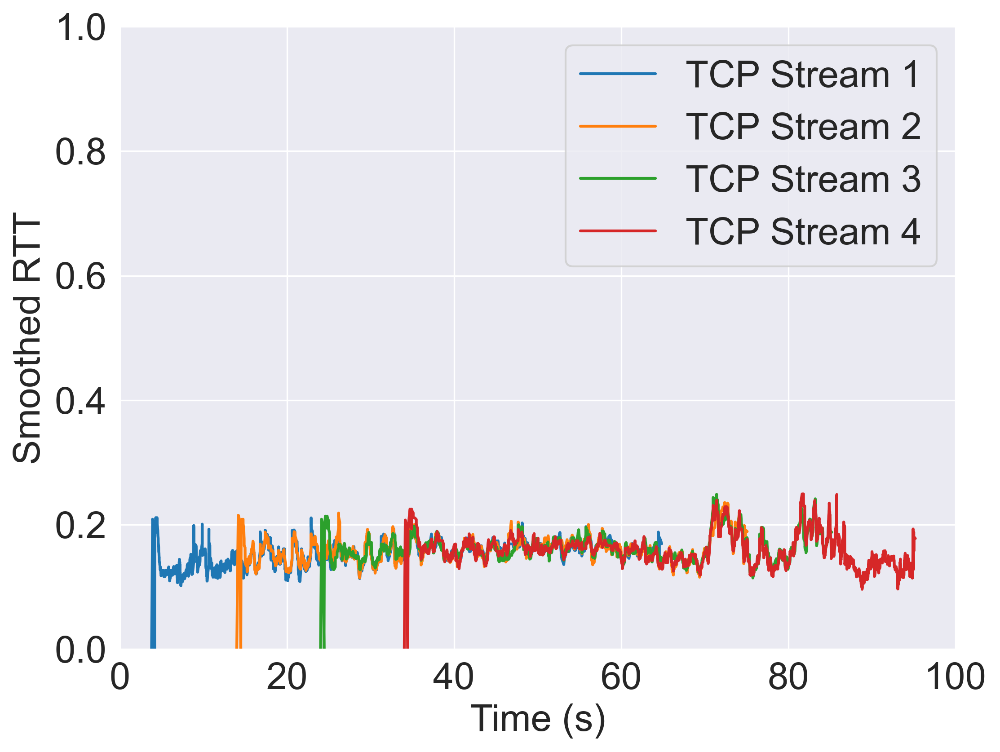

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


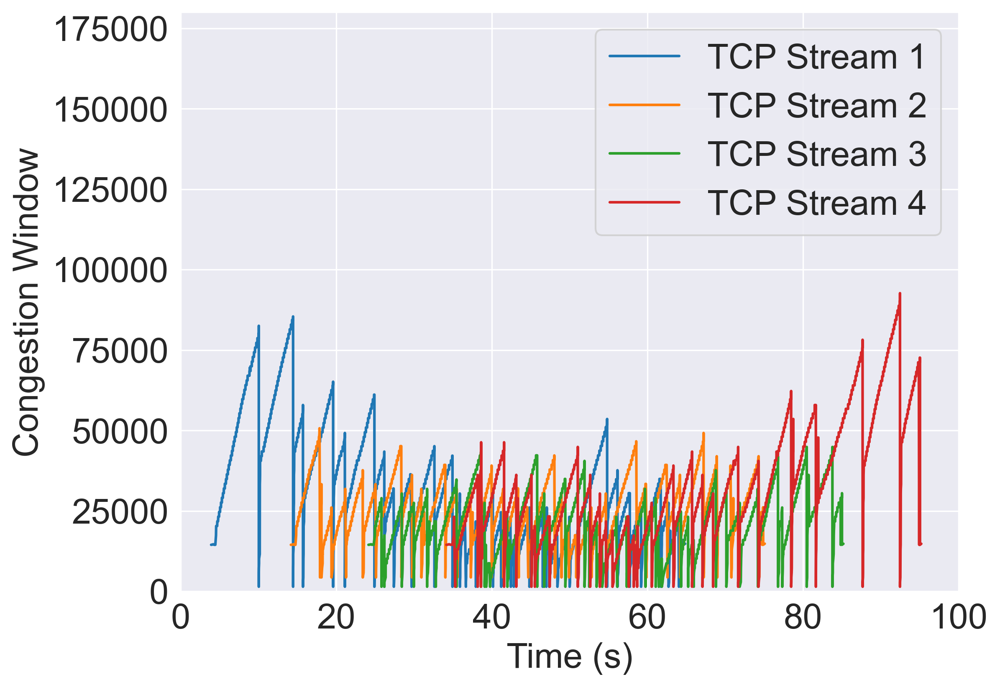

codel_1Mbps_20ms_ecn.siftr.log
count    1309.000000
mean        0.446822
std         0.248781
min         0.000000
25%         0.269375
50%         0.347187
75%         0.645938
max         1.231562
Name: SmoothedRTT, dtype: float64
2101    0.000000
2115    0.368437
2116    0.368437
2131    0.343750
2132    0.343750
Name: SmoothedRTT, dtype: float64
6025    0.303750
6026    0.303750
6031    0.282187
6033    0.282187
6034    0.282187
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/codel_1Mbps_20ms_ecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


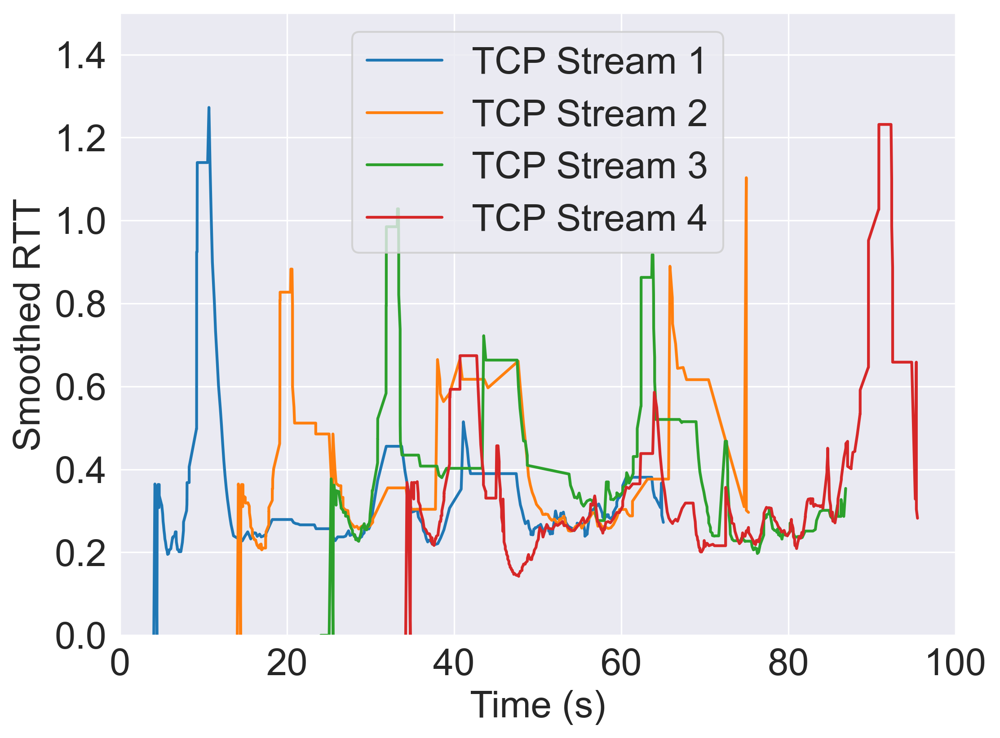

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


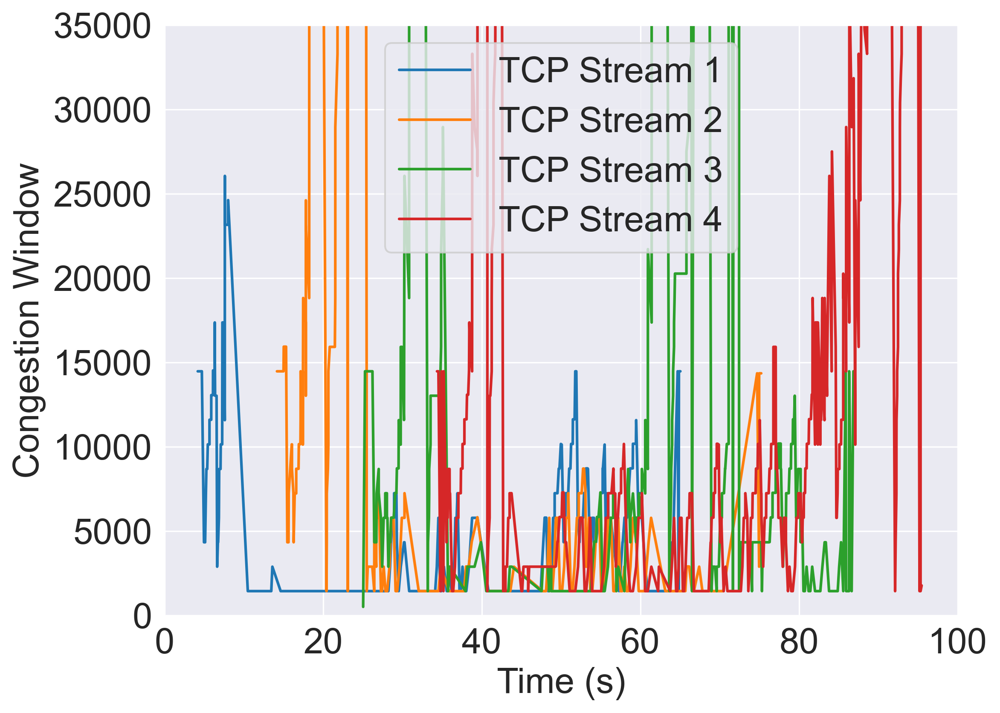

codel_1Mbps_20ms_noecn.siftr.log
count    992.000000
mean       0.271528
std        0.100733
min        0.000000
25%        0.220938
50%        0.251563
75%        0.285000
max        0.804375
Name: SmoothedRTT, dtype: float64
2121    0.000000
2138    0.794375
2139    0.794375
2159    0.725313
2160    0.725313
Name: SmoothedRTT, dtype: float64
6355    0.613750
6356    0.613750
6369    0.550937
6371    0.550937
6372    0.550937
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/codel_1Mbps_20ms_noecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


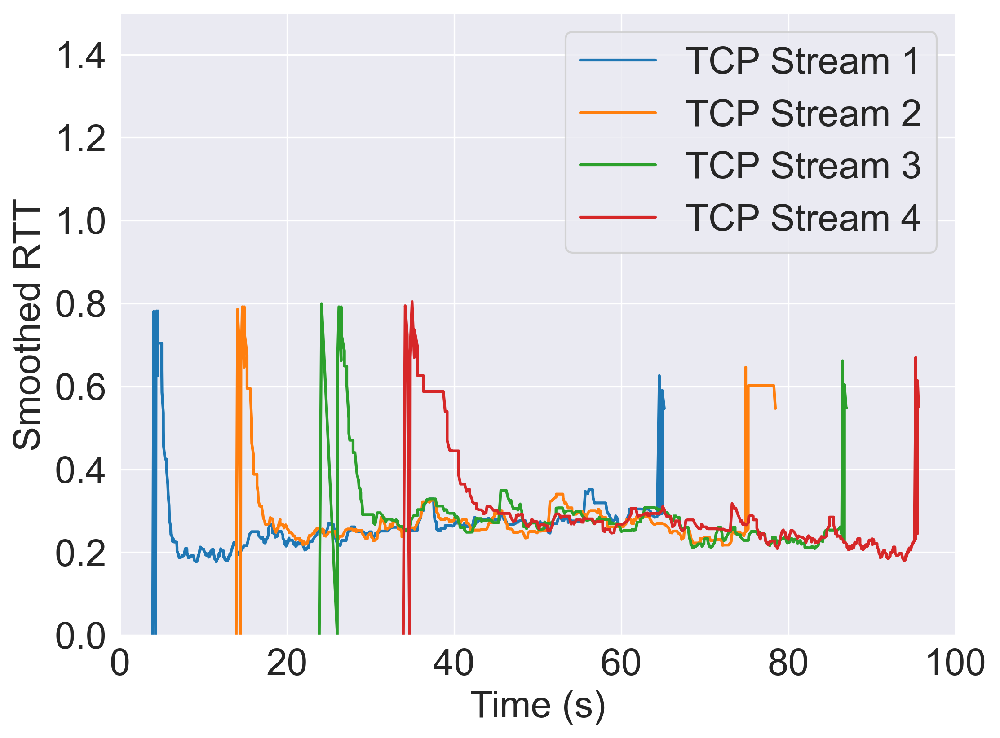

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


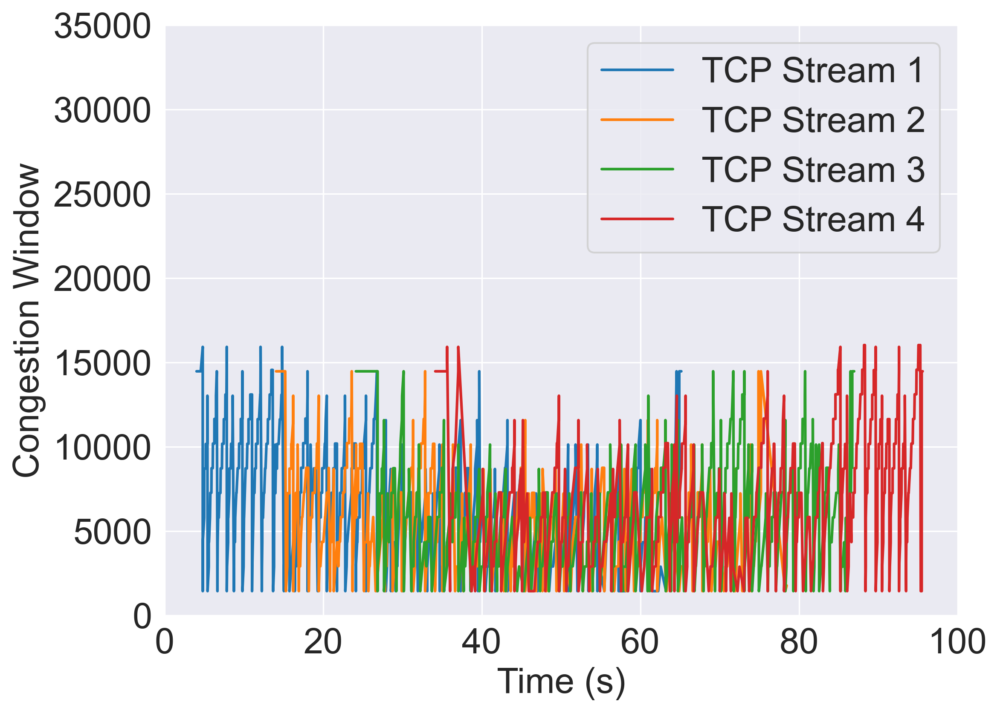

fq_codel_10Mbps_20ms_ecn.siftr.log
count    10147.000000
mean         0.588696
std          0.132434
min          0.000000
25%          0.505938
50%          0.606875
75%          0.690000
max          0.907188
Name: SmoothedRTT, dtype: float64
15180    0.000000
15394    0.391875
15395    0.391875
15516    0.378125
15517    0.378125
Name: SmoothedRTT, dtype: float64
53528    0.323750
53530    0.323750
53531    0.323750
53642    0.516875
53643    0.516875
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/fq_codel_10Mbps_20ms_ecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


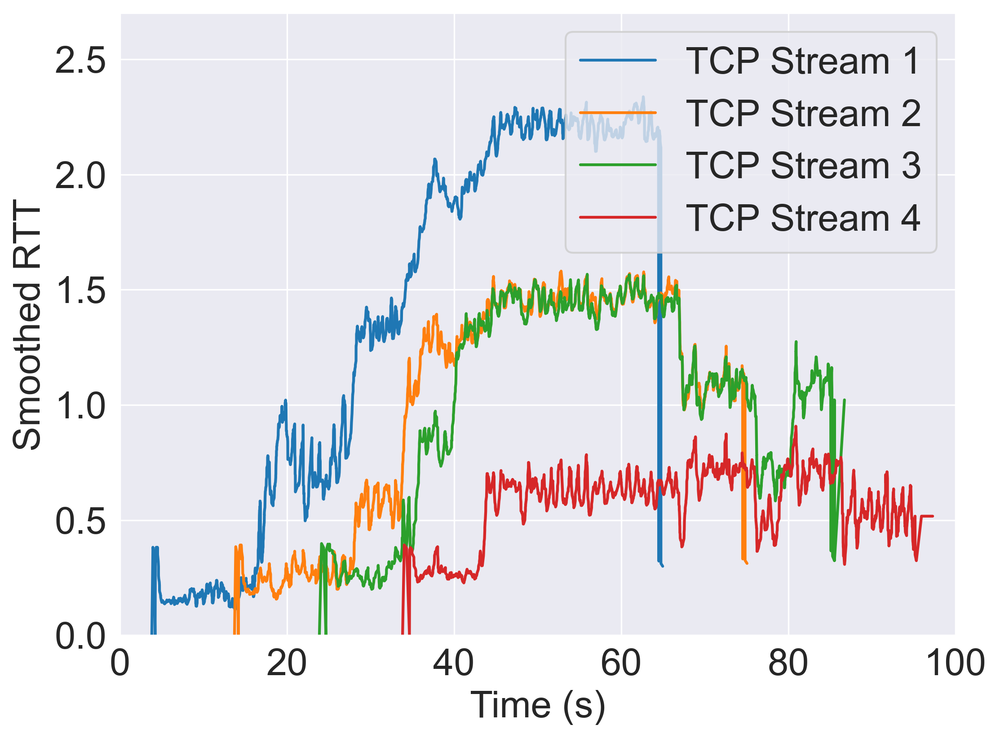

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


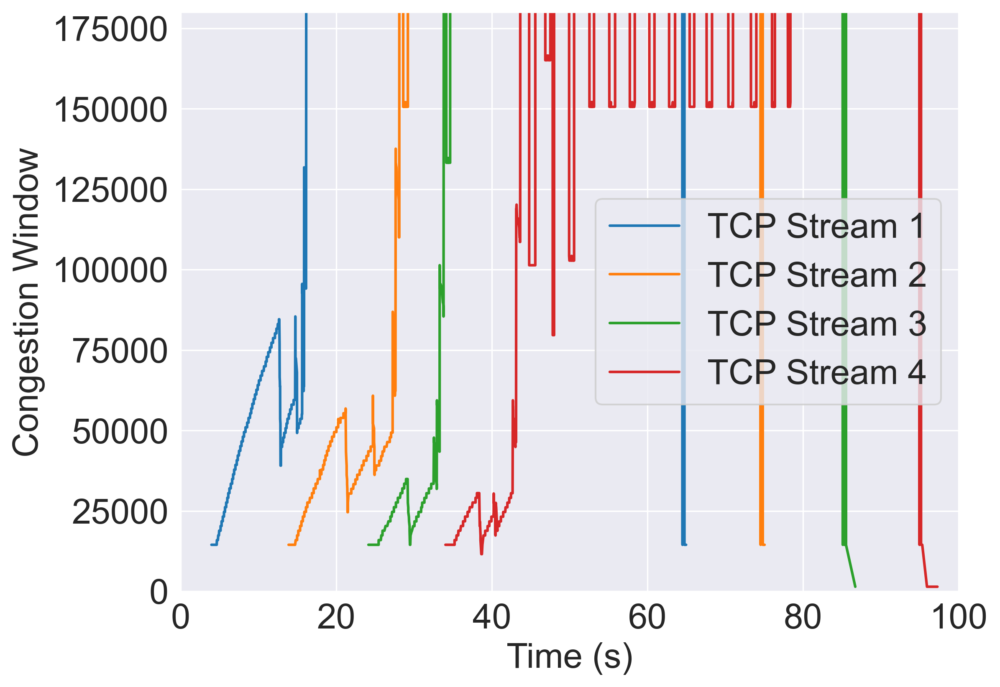

fq_codel_10Mbps_20ms_noecn.siftr.log
count    7340.000000
mean        0.205421
std         0.036955
min         0.000000
25%         0.182188
50%         0.205000
75%         0.226562
max         0.498750
Name: SmoothedRTT, dtype: float64
12043    0.000000
12131    0.498750
12132    0.498750
12229    0.461562
12230    0.461562
Name: SmoothedRTT, dtype: float64
40594    0.393437
40595    0.393437
40623    0.356875
40625    0.356875
40626    0.356875
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/fq_codel_10Mbps_20ms_noecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


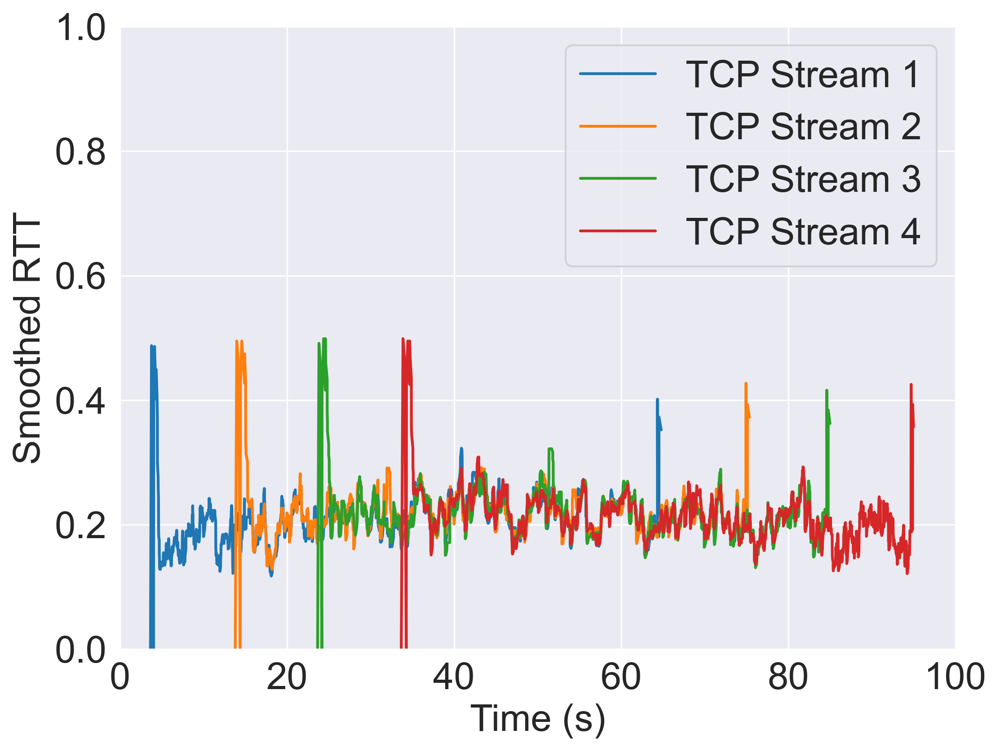

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


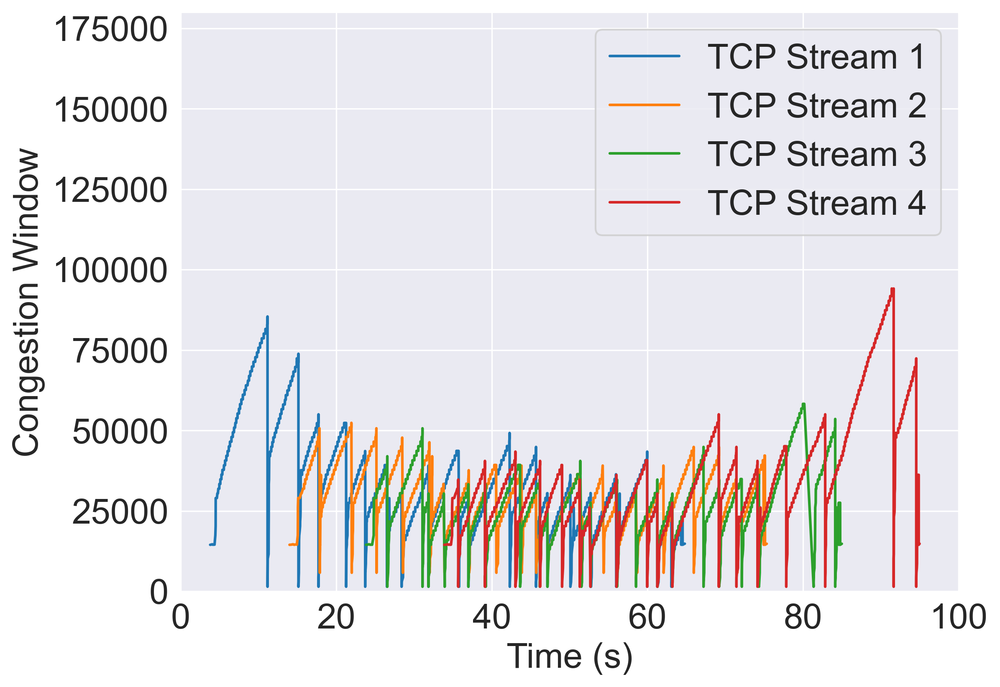

fq_codel_1Mbps_20ms_ecn.siftr.log
count    1031.000000
mean        2.170596
std         1.384231
min         0.000000
25%         1.087813
50%         2.169375
75%         3.334687
max         4.490312
Name: SmoothedRTT, dtype: float64
2270    0.000000
2284    0.229063
2285    0.229063
2299    0.223125
2300    0.223125
Name: SmoothedRTT, dtype: float64
6807    0.205937
6808    0.205937
6820    0.197813
6822    0.197813
6823    0.197813
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/fq_codel_1Mbps_20ms_ecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


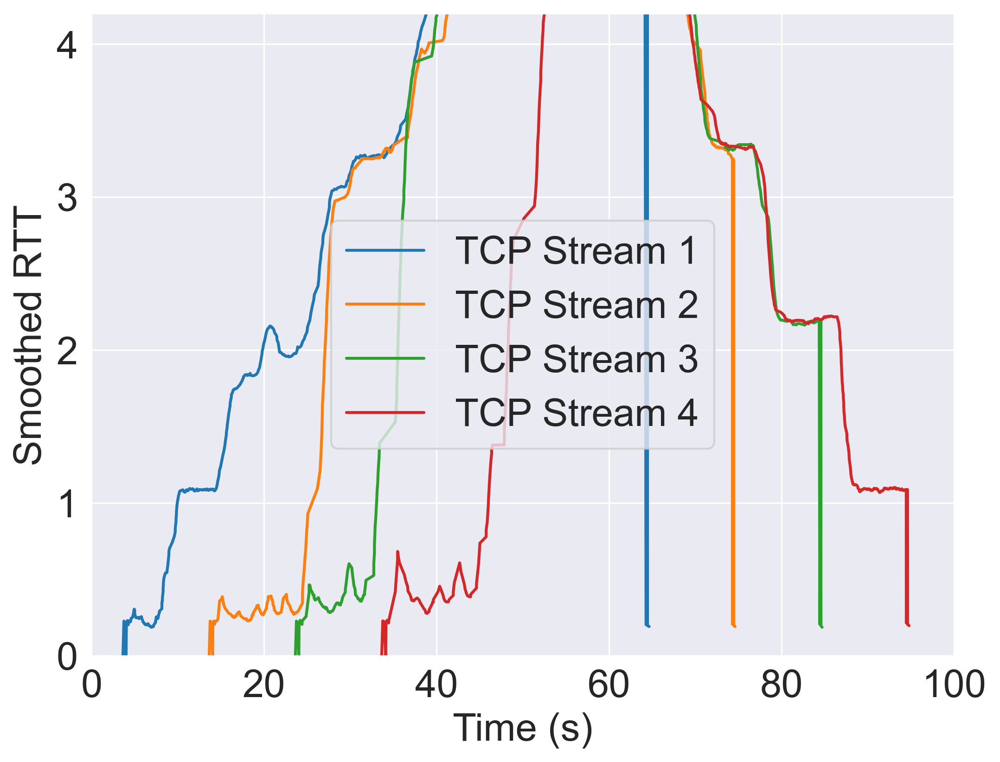

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


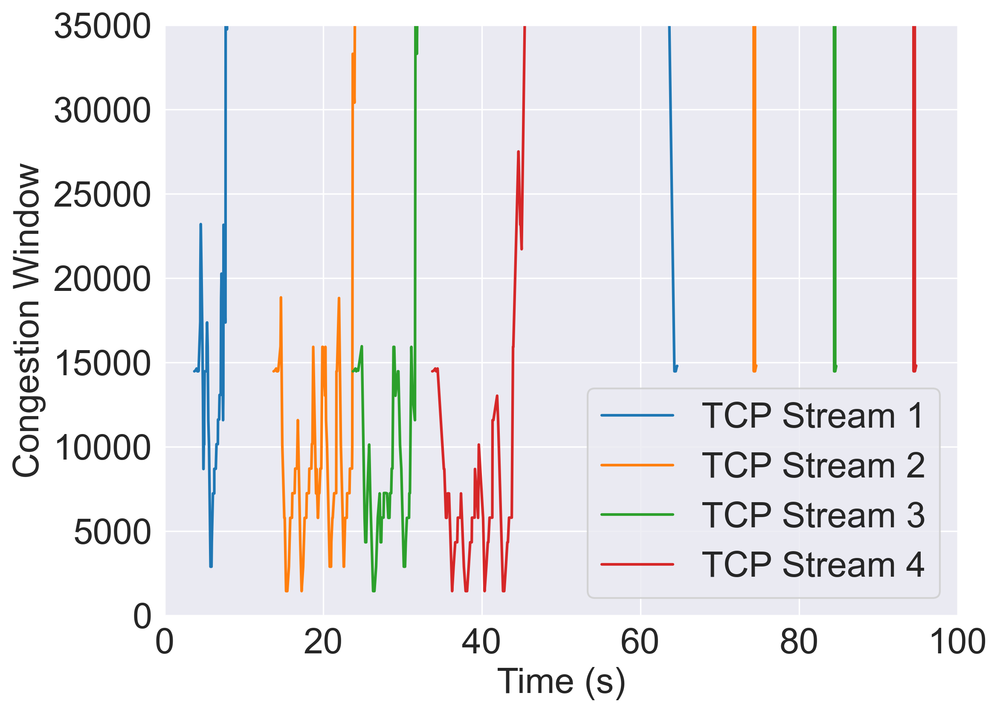

fq_codel_1Mbps_20ms_noecn.siftr.log
count    1074.000000
mean        0.265727
std         0.125885
min         0.000000
25%         0.202813
50%         0.235781
75%         0.273750
max         0.914687
Name: SmoothedRTT, dtype: float64
2332    0.000000
2349    0.914687
2350    0.914687
2364    0.818125
2365    0.818125
Name: SmoothedRTT, dtype: float64
7118    0.661875
7119    0.661875
7127    0.593125
7129    0.593125
7130    0.593125
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/fq_codel_1Mbps_20ms_noecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


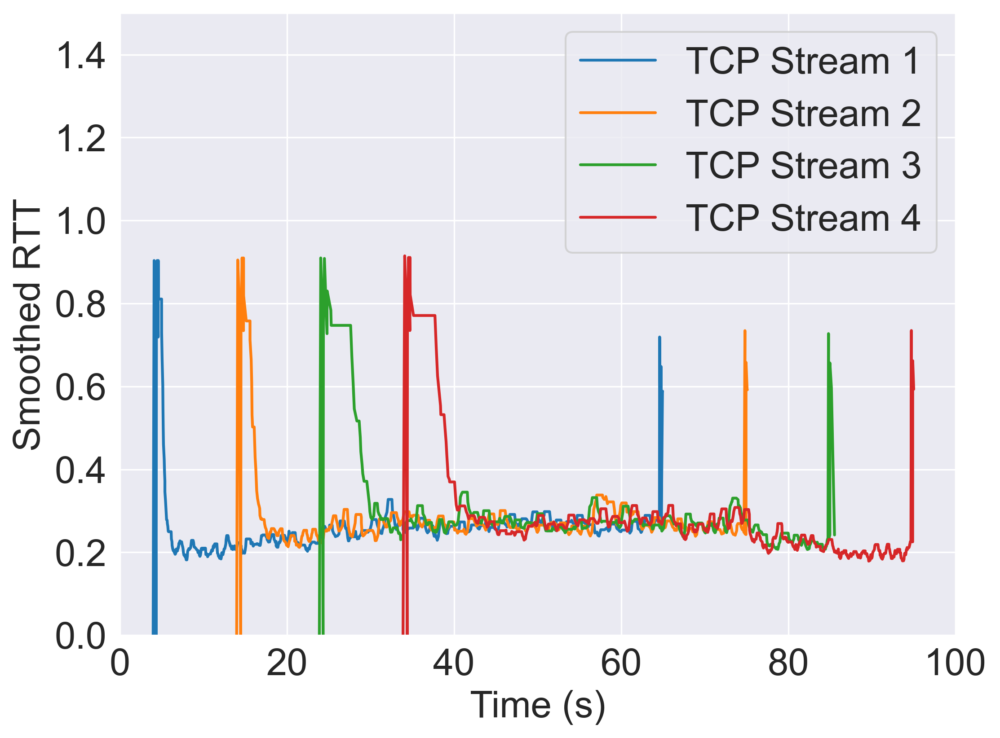

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


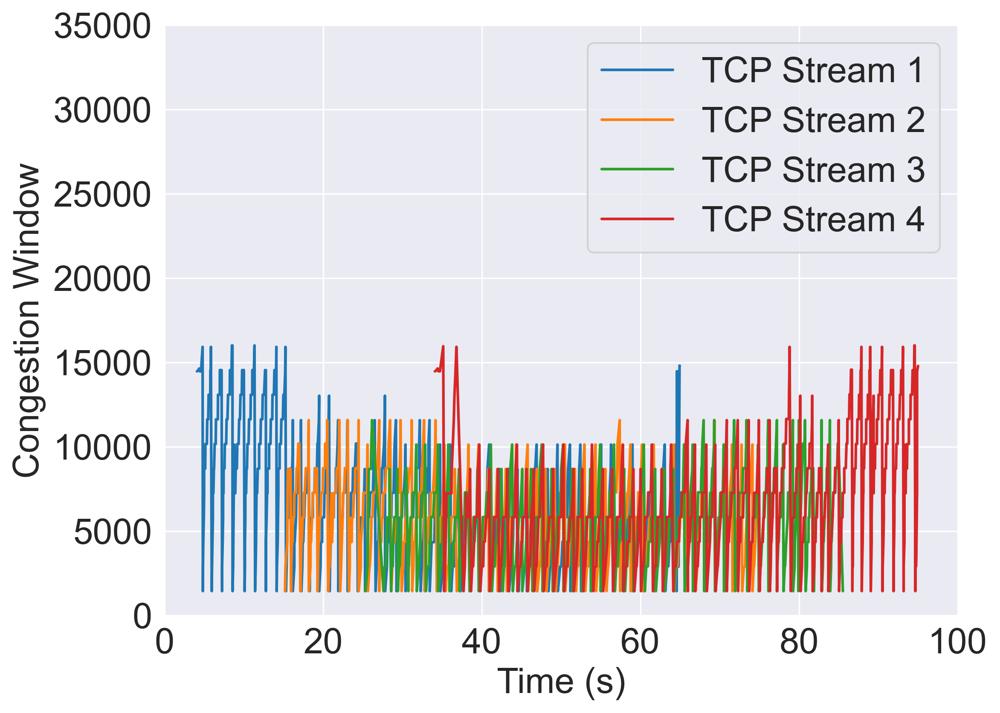

fq_pie_10Mbps_20ms_ecn.siftr.log
count    10426.000000
mean         0.273294
std          0.066569
min          0.000000
25%          0.222500
50%          0.269062
75%          0.314688
max          0.547500
Name: SmoothedRTT, dtype: float64
14533    0.000000
14674    0.228437
14675    0.228437
14782    0.226250
14783    0.226250
Name: SmoothedRTT, dtype: float64
49693    0.227187
49694    0.227187
49788    0.221562
49790    0.221562
49791    0.221562
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/fq_pie_10Mbps_20ms_ecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


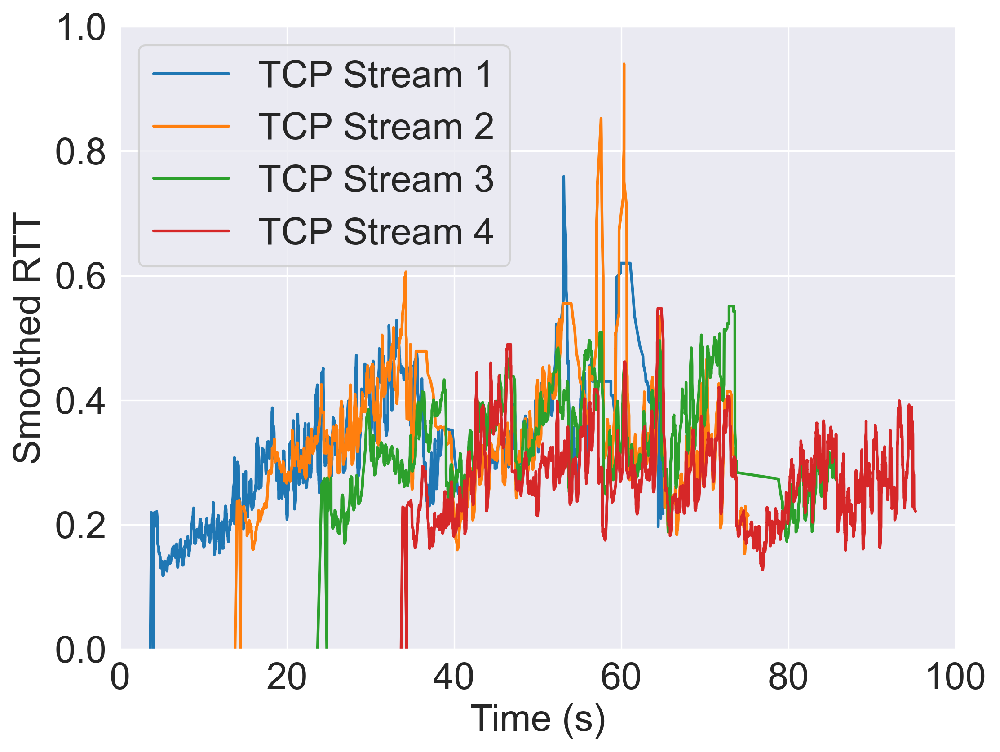

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


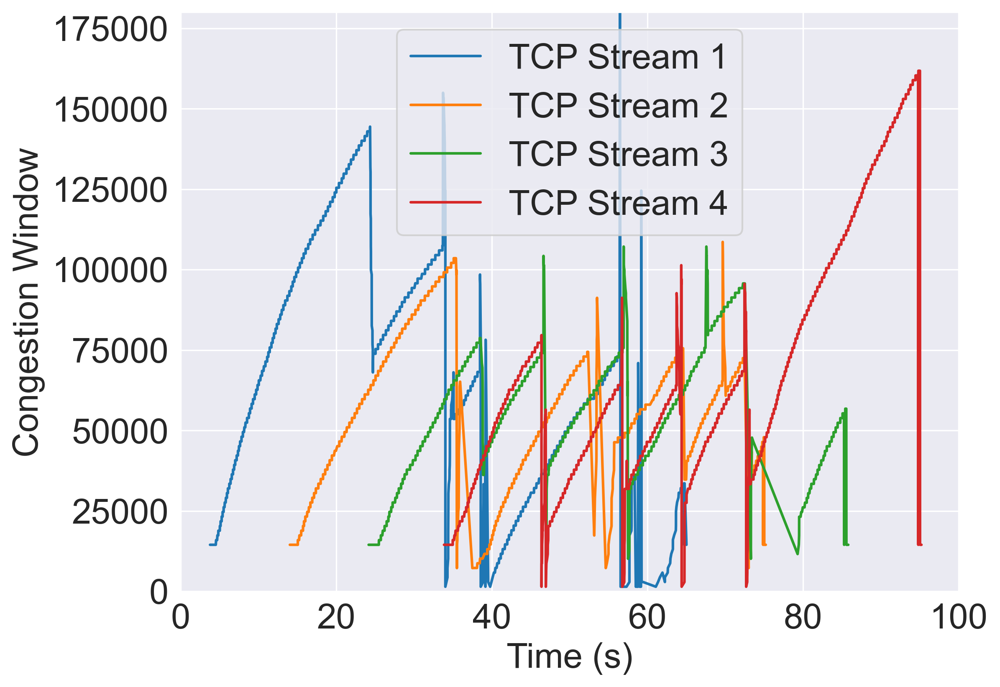

fq_pie_10Mbps_20ms_noecn.siftr.log
count    8933.000000
mean        0.311843
std         0.097896
min         0.000000
25%         0.241250
50%         0.329062
75%         0.384375
max         0.537500
Name: SmoothedRTT, dtype: float64
14837    0.00000
14997    0.23000
14998    0.23000
15069    0.22125
15070    0.22125
Name: SmoothedRTT, dtype: float64
48924    0.197813
48926    0.199375
48982    0.208750
48984    0.208750
48985    0.208750
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/fq_pie_10Mbps_20ms_noecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


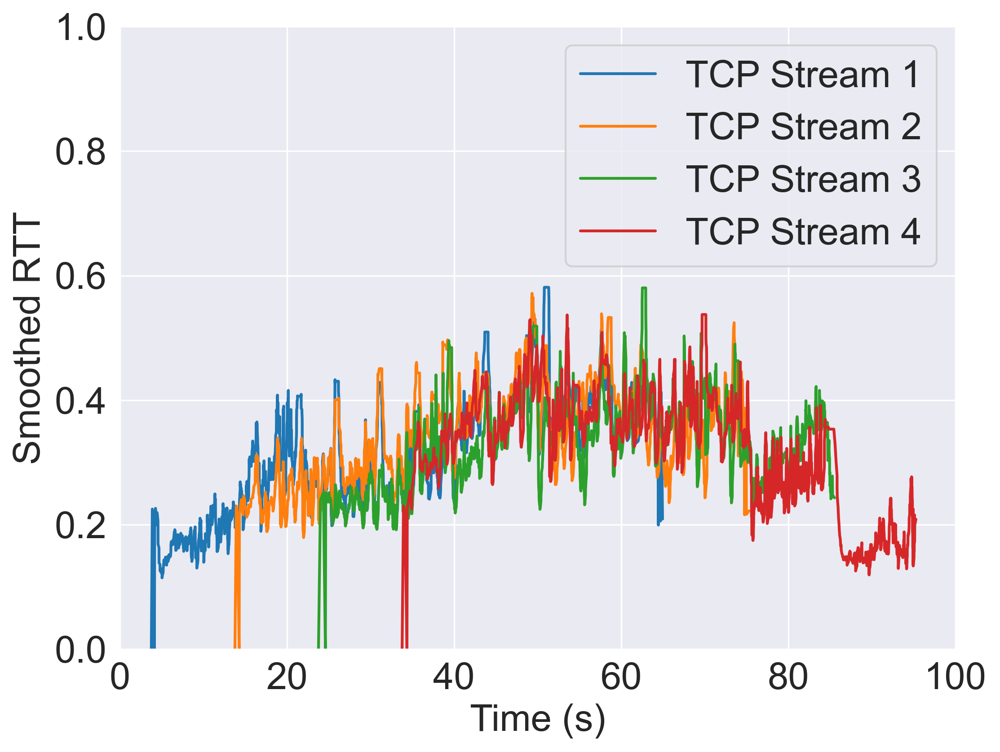

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


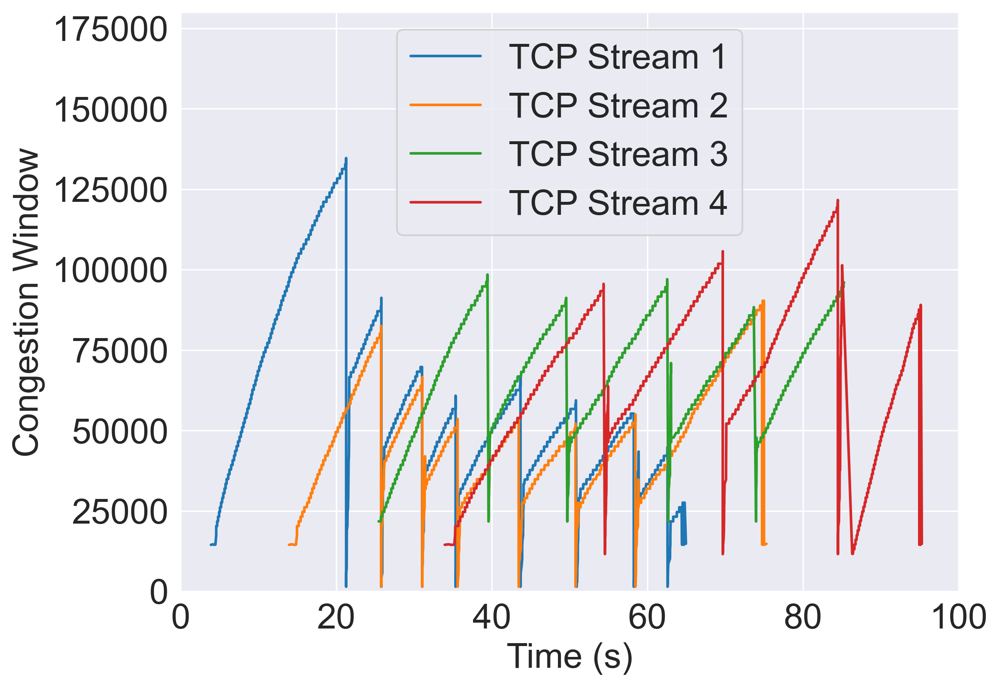

fq_pie_1Mbps_20ms_ecn.siftr.log
count    1131.000000
mean        0.324249
std         0.059489
min         0.000000
25%         0.283906
50%         0.325625
75%         0.361563
max         0.497188
Name: SmoothedRTT, dtype: float64
2329    0.000000
2344    0.298125
2345    0.298125
2354    0.277187
2355    0.277187
Name: SmoothedRTT, dtype: float64
7181    0.302187
7182    0.302187
7191    0.275938
7193    0.275938
7194    0.275938
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/fq_pie_1Mbps_20ms_ecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


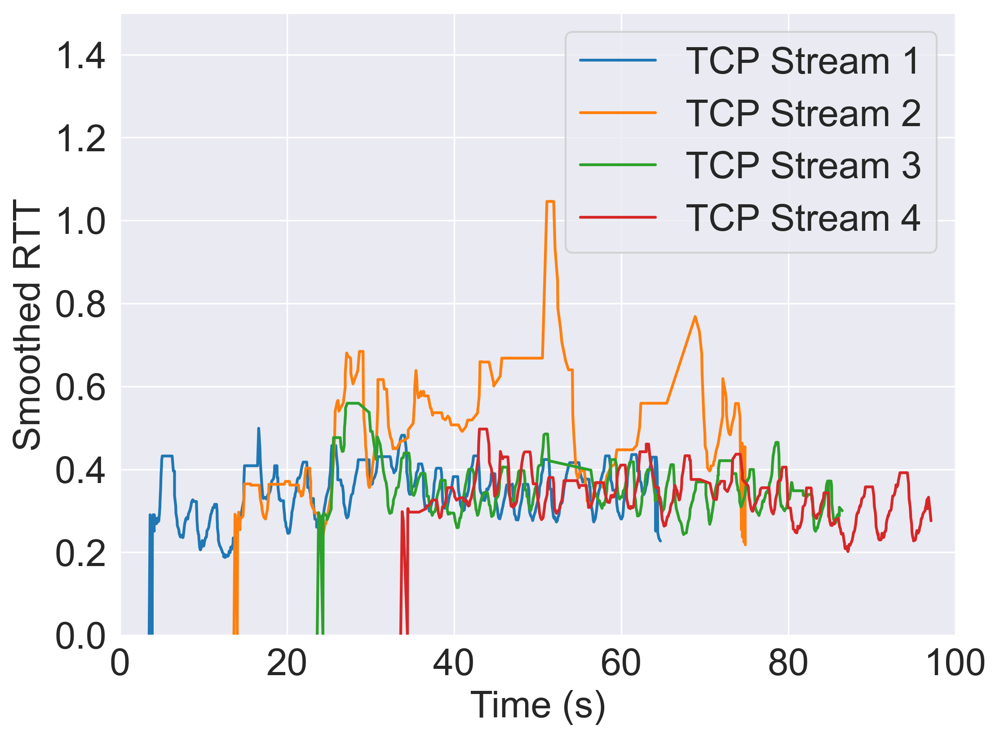

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


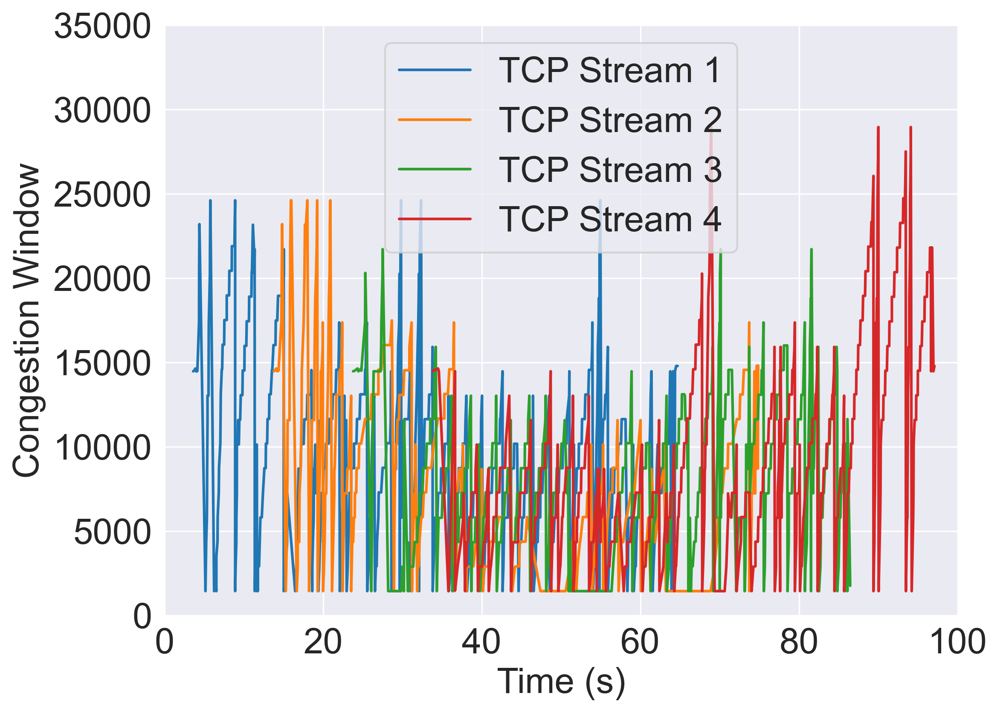

fq_pie_1Mbps_20ms_noecn.siftr.log
count    1010.000000
mean        0.313696
std         0.066588
min         0.000000
25%         0.271094
50%         0.304375
75%         0.364063
max         0.481875
Name: SmoothedRTT, dtype: float64
2322    0.000000
2335    0.273750
2336    0.273750
2362    0.262188
2363    0.262188
Name: SmoothedRTT, dtype: float64
7021    0.233437
7022    0.233437
7036    0.221875
7038    0.221875
7039    0.221875
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/fq_pie_1Mbps_20ms_noecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


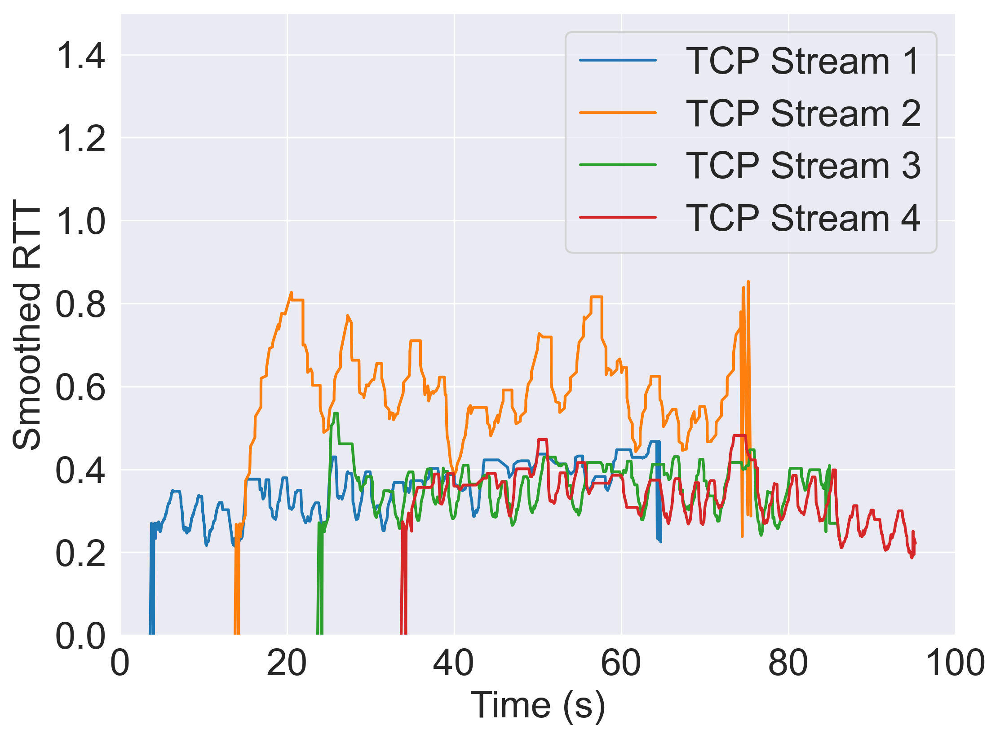

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


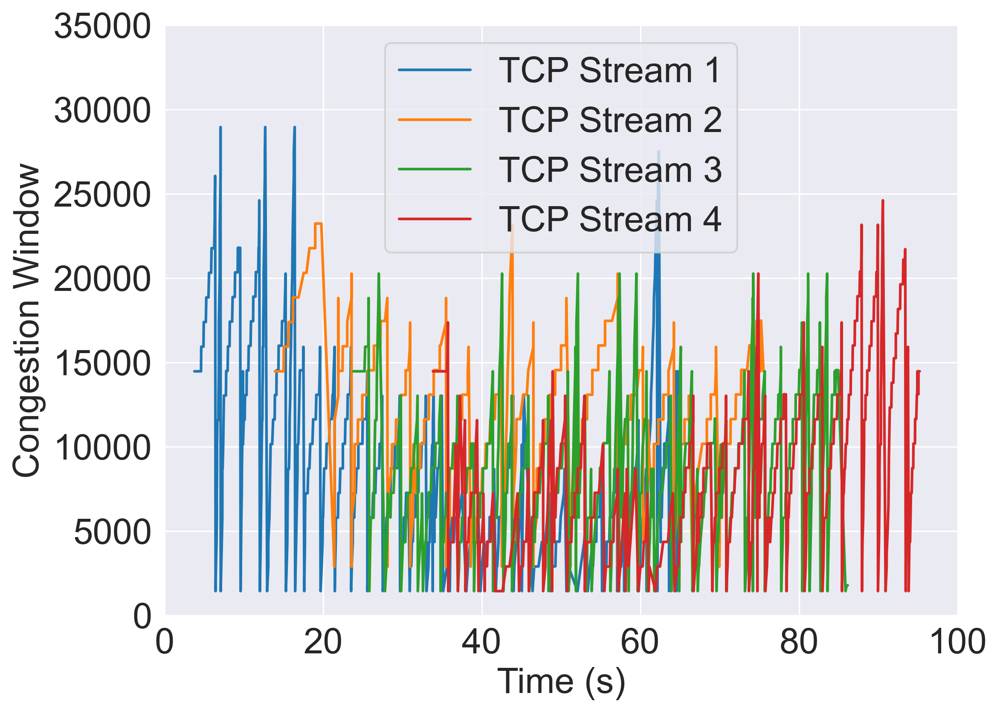

l4s_10Mbps_20ms_ecn.siftr.log
count    7402.000000
mean        0.266848
std         0.056693
min         0.000000
25%         0.225312
50%         0.264062
75%         0.302422
max         0.450313
Name: SmoothedRTT, dtype: float64
14745    0.000000
14842    0.310312
14843    0.310312
14996    0.297812
14997    0.297812
Name: SmoothedRTT, dtype: float64
50225    0.306563
50307    0.284687
50309    0.284687
50310    0.284687
50323    0.263125
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/l4s_10Mbps_20ms_ecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


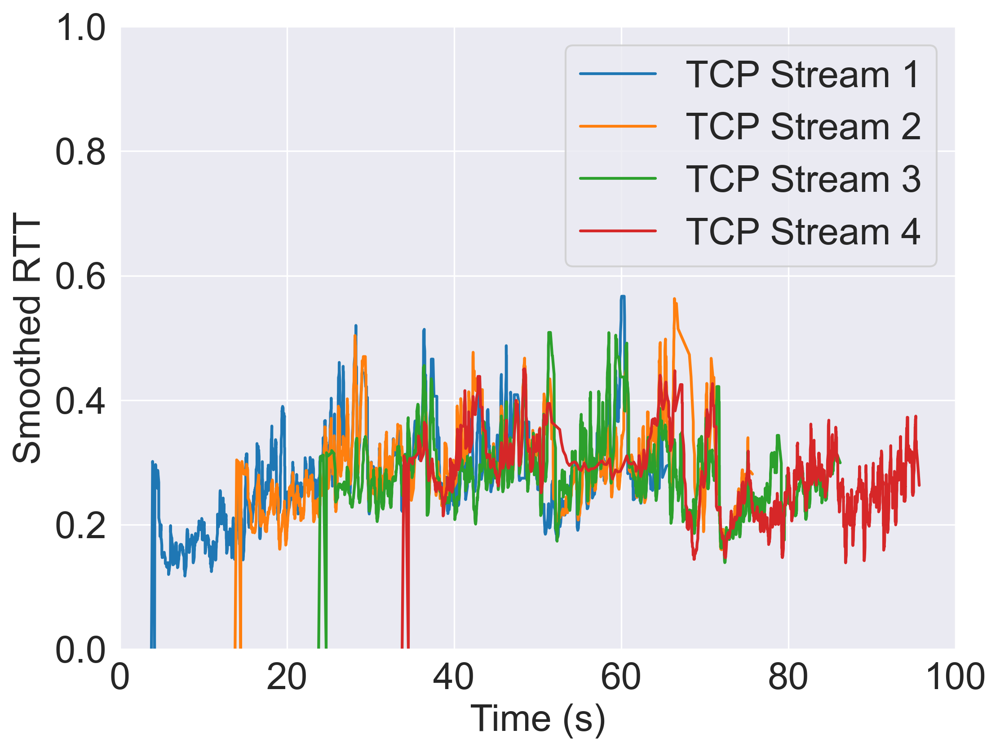

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


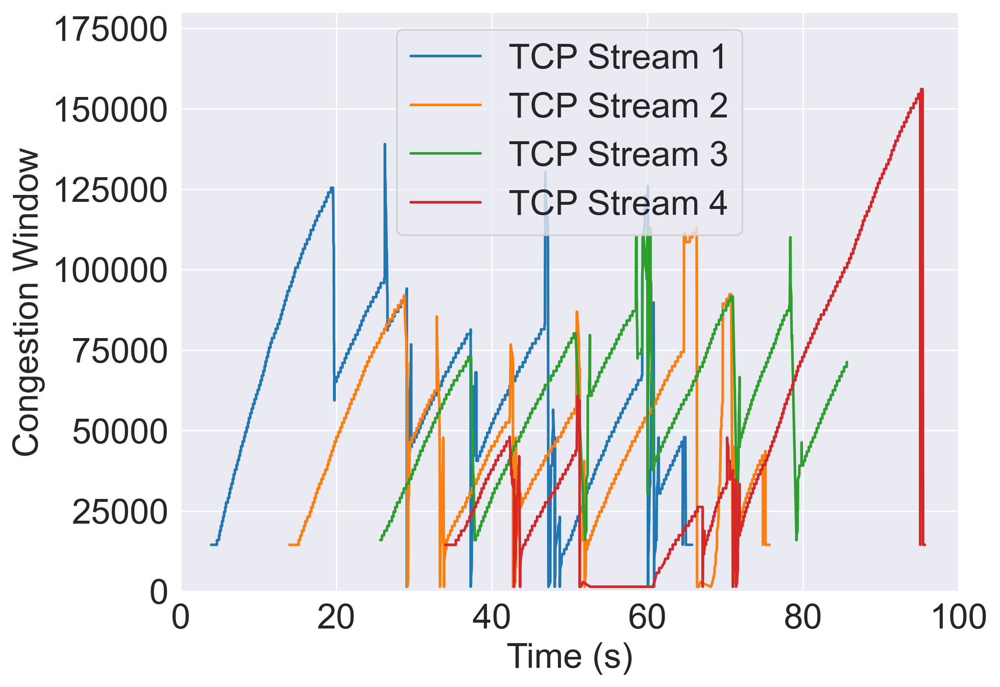

l4s_10Mbps_20ms_noecn.siftr.log
count    7488.000000
mean        0.297343
std         0.089393
min         0.000000
25%         0.223125
50%         0.297812
75%         0.370625
max         0.523125
Name: SmoothedRTT, dtype: float64
14379    0.000000
14620    0.289062
14624    0.289062
14849    0.309375
14850    0.309375
Name: SmoothedRTT, dtype: float64
49127    0.292187
49128    0.292187
49207    0.268437
49209    0.268437
49210    0.268437
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/l4s_10Mbps_20ms_noecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


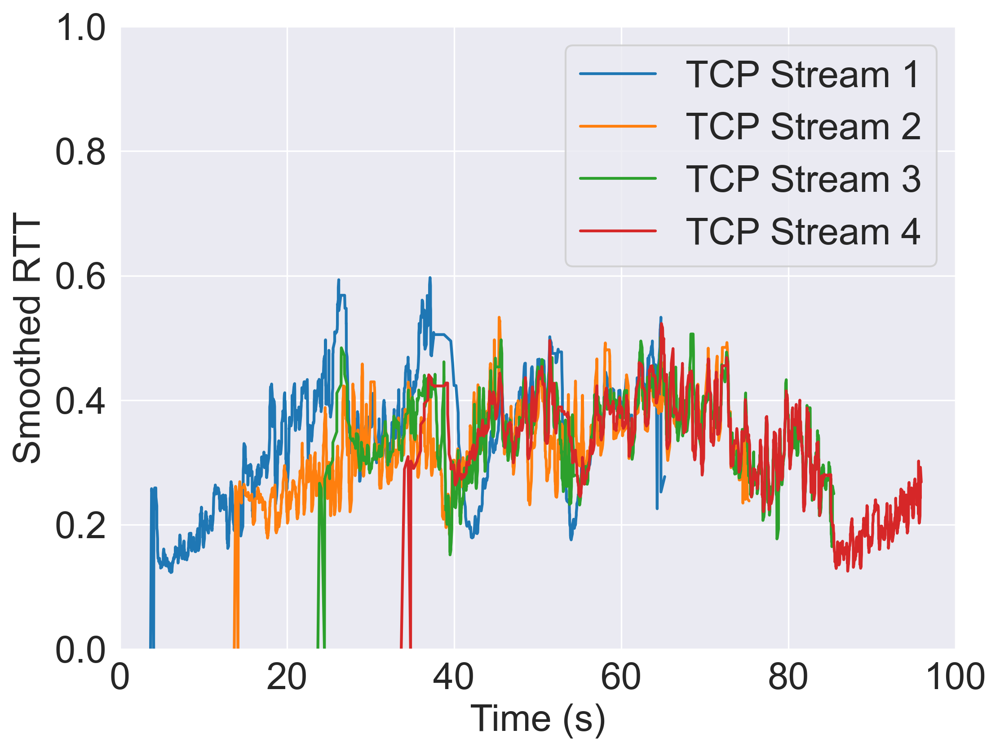

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


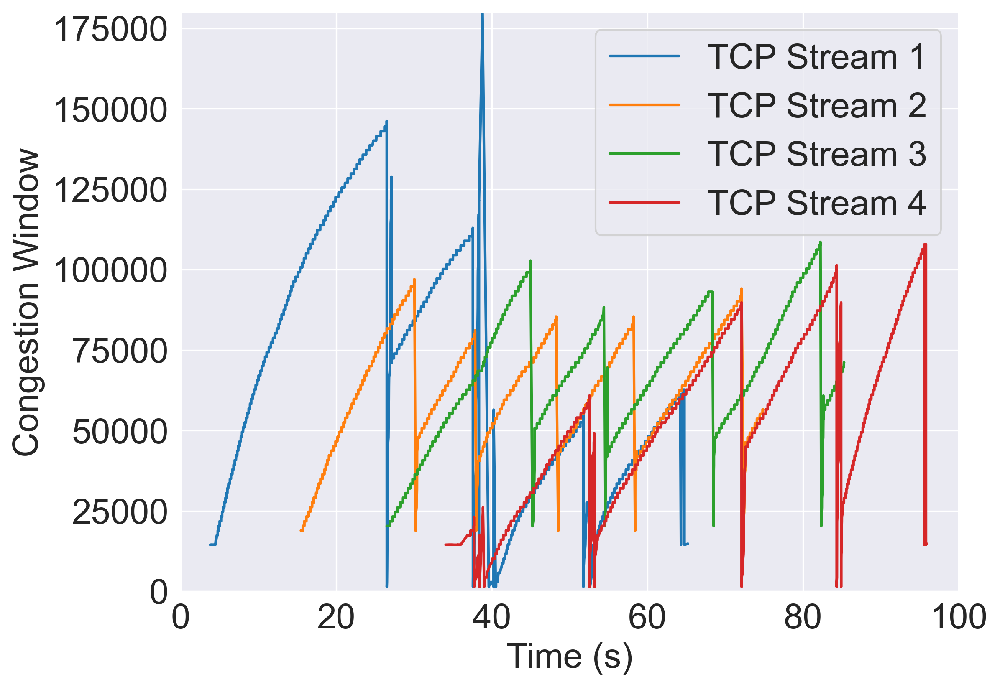

l4s_1Mbps_20ms_ecn.siftr.log
count    993.000000
mean       0.296168
std        0.056472
min        0.000000
25%        0.260313
50%        0.293750
75%        0.327813
max        0.508125
Name: SmoothedRTT, dtype: float64
2121    0.000000
2133    0.202813
2134    0.202813
2169    0.240000
2170    0.240000
Name: SmoothedRTT, dtype: float64
6731    0.244688
6749    0.251875
6751    0.251875
6752    0.251875
6765    0.235625
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/l4s_1Mbps_20ms_ecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


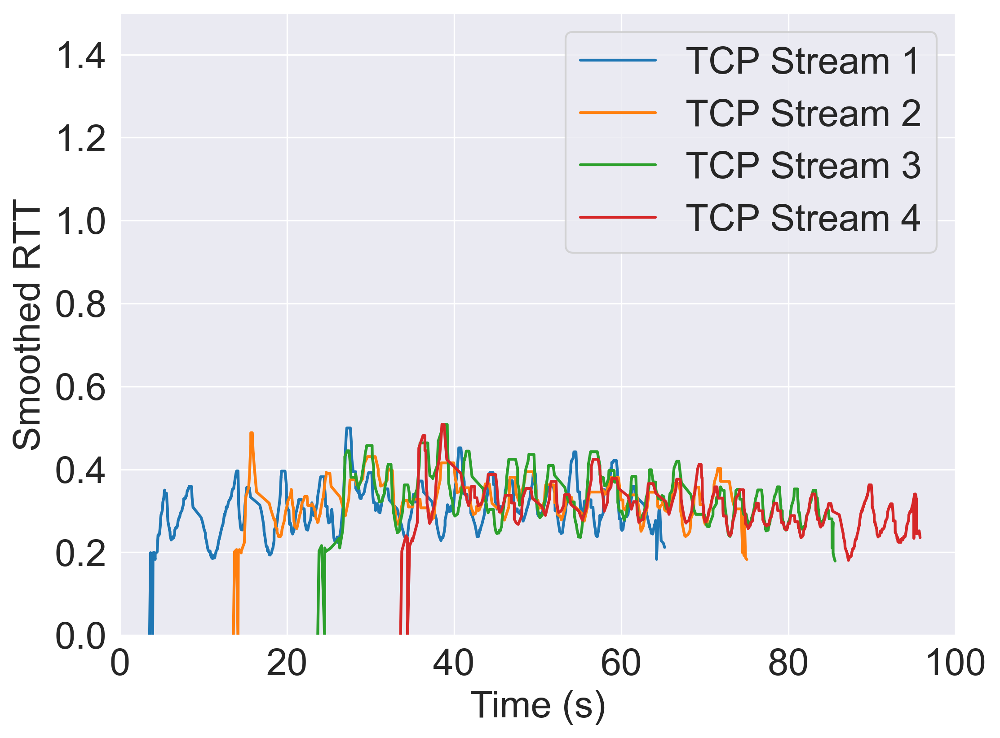

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


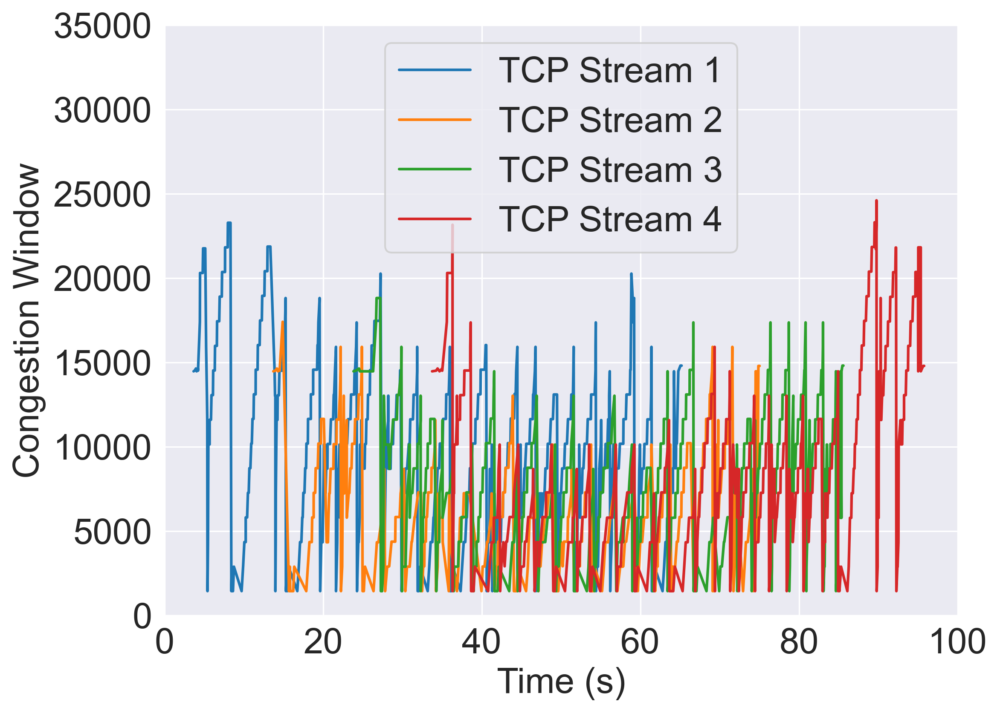

l4s_1Mbps_20ms_noecn.siftr.log
count    1048.000000
mean        0.369524
std         0.108279
min         0.000000
25%         0.289609
50%         0.340781
75%         0.455078
max         0.635625
Name: SmoothedRTT, dtype: float64
2321    0.000000
2373    0.294063
2374    0.294063
2426    0.343750
2427    0.343750
Name: SmoothedRTT, dtype: float64
7027    0.426563
7028    0.426563
7044    0.405938
7046    0.405938
7047    0.405938
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/l4s_1Mbps_20ms_noecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


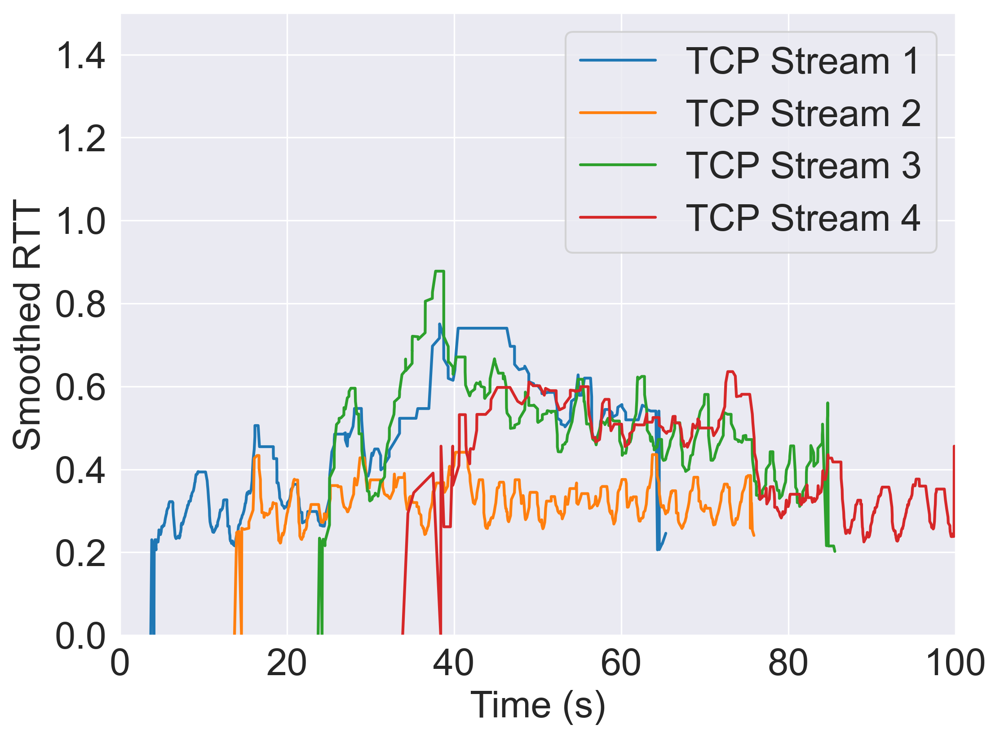

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


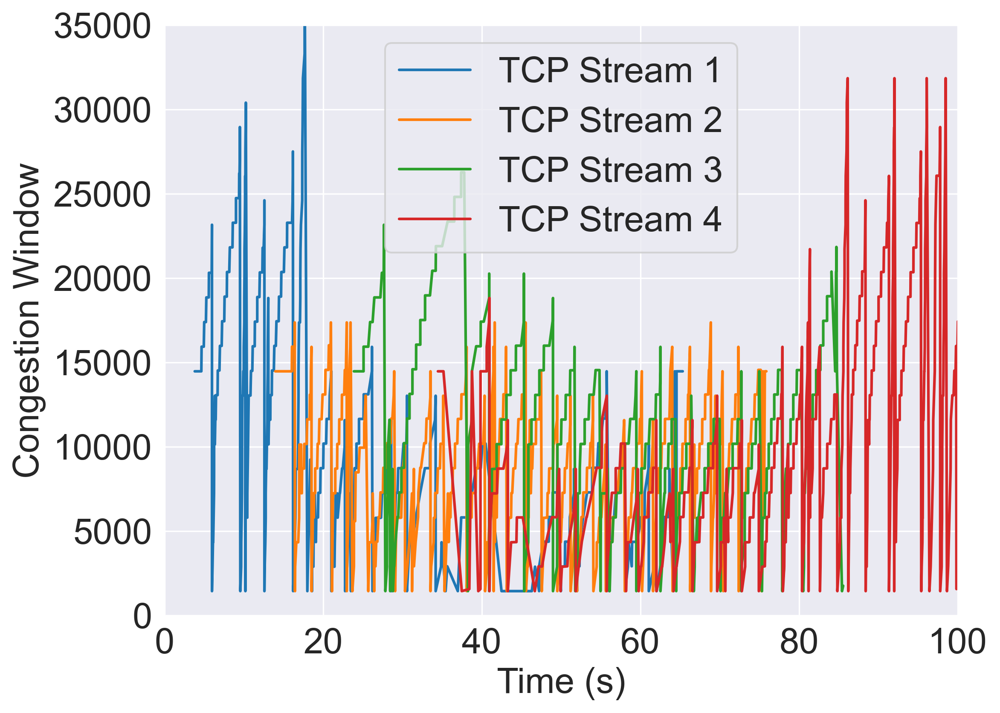

pie_10Mbps_20ms_ecn.siftr.log
count    9614.000000
mean        0.168509
std         0.028228
min         0.000000
25%         0.147266
50%         0.169687
75%         0.188750
max         0.246250
Name: SmoothedRTT, dtype: float64
14327    0.000000
14426    0.219375
14427    0.219375
14531    0.212188
14532    0.212188
Name: SmoothedRTT, dtype: float64
47707    0.197813
47708    0.197813
47773    0.189375
47775    0.189375
47776    0.189375
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/pie_10Mbps_20ms_ecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


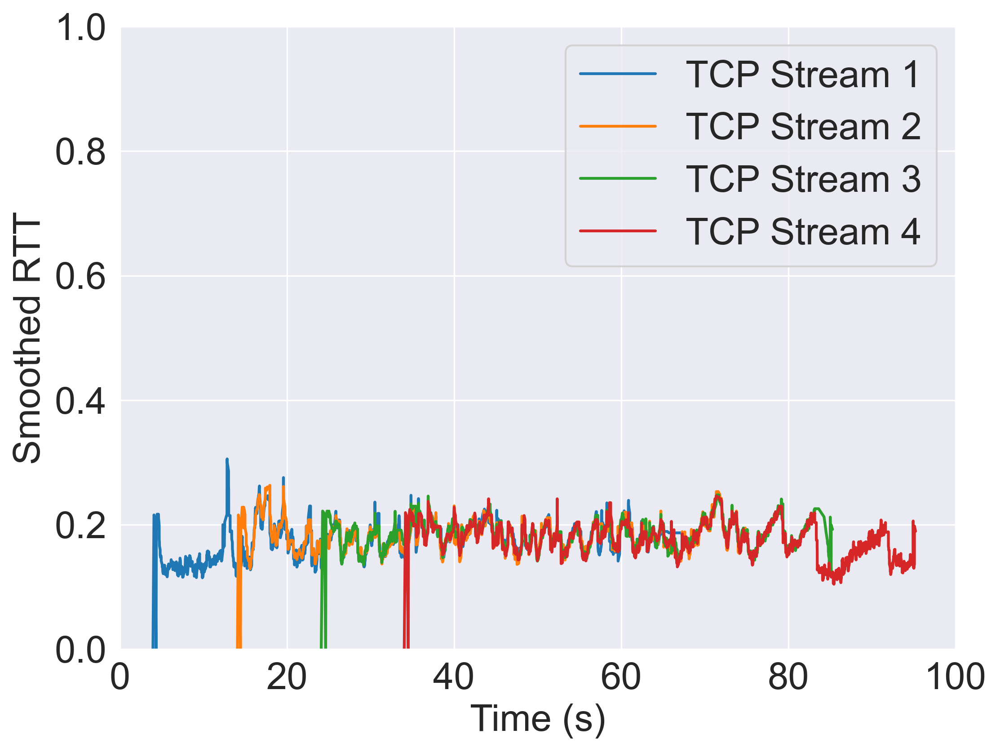

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


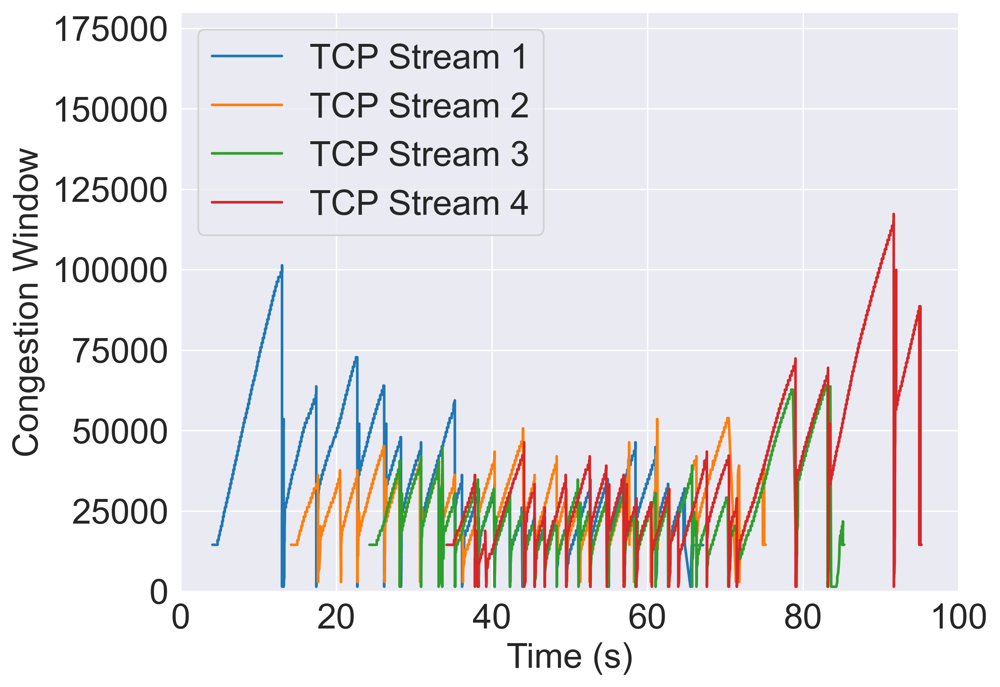

pie_10Mbps_20ms_noecn.siftr.log
count    9787.000000
mean        0.167295
std         0.029115
min         0.000000
25%         0.141875
50%         0.167813
75%         0.190938
max         0.241563
Name: SmoothedRTT, dtype: float64
16276    0.000000
16379    0.162812
16380    0.162812
16492    0.163750
16493    0.163750
Name: SmoothedRTT, dtype: float64
52241    0.161875
52242    0.161875
52296    0.156875
52298    0.156875
52299    0.156875
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/pie_10Mbps_20ms_noecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


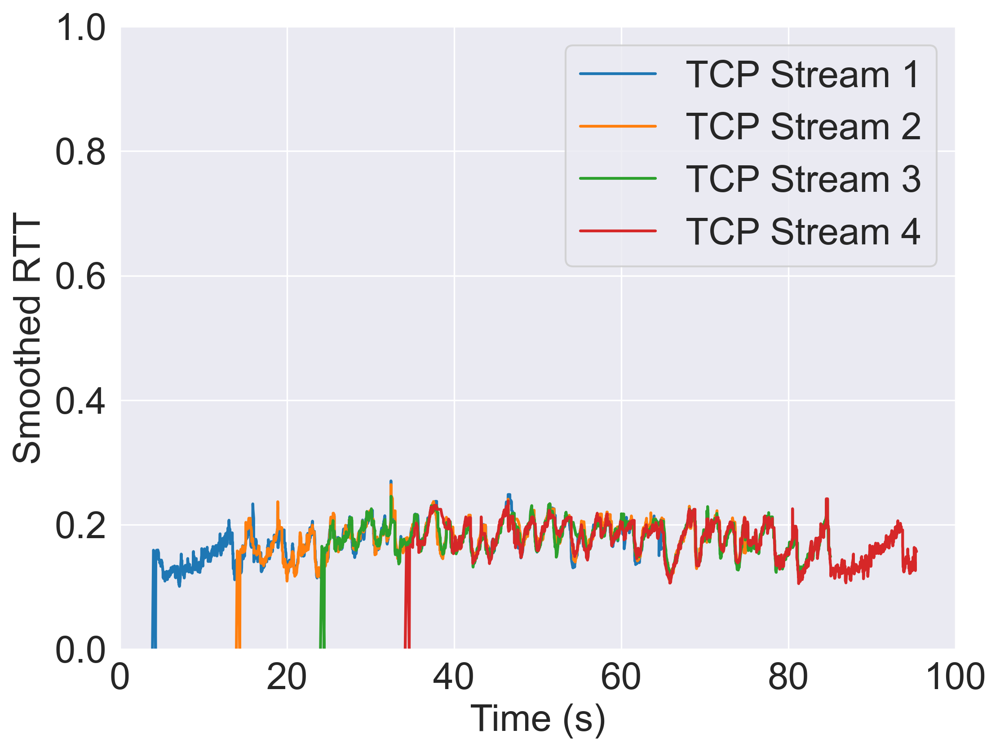

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


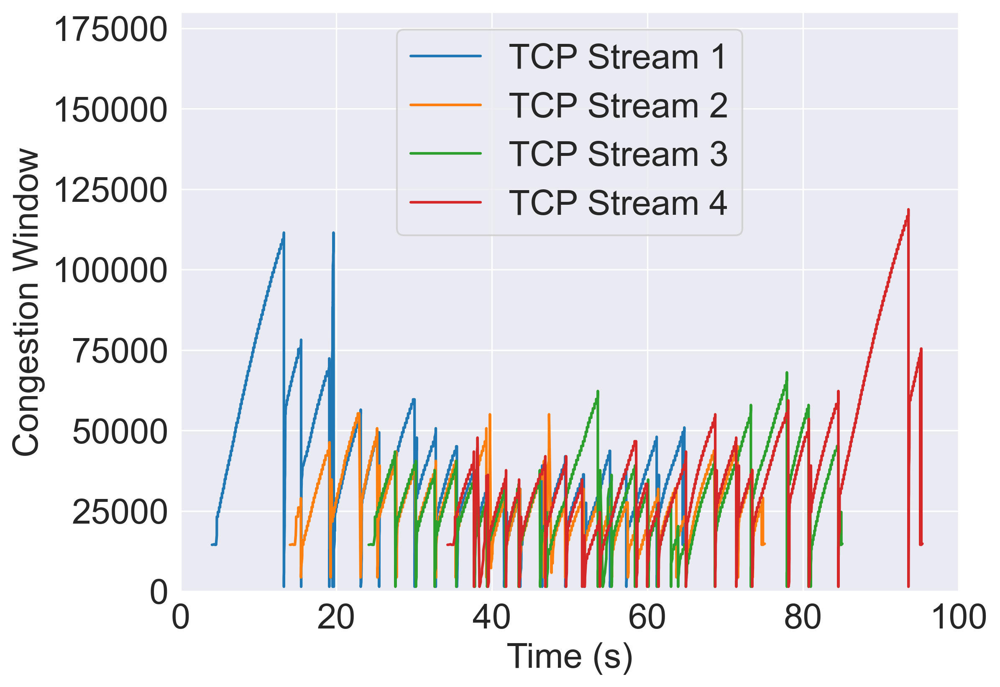

pie_1Mbps_20ms_ecn.siftr.log
count    975.000000
mean       0.265177
std        0.131255
min        0.000000
25%        0.221094
50%        0.232813
75%        0.247812
max        1.062500
Name: SmoothedRTT, dtype: float64
1989    0.000000
2044    0.000000
2136    0.305000
2169    0.305000
2235    0.401875
Name: SmoothedRTT, dtype: float64
7185    0.519375
7186    0.519375
7200    0.470938
7202    0.470938
7203    0.470938
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/pie_1Mbps_20ms_ecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


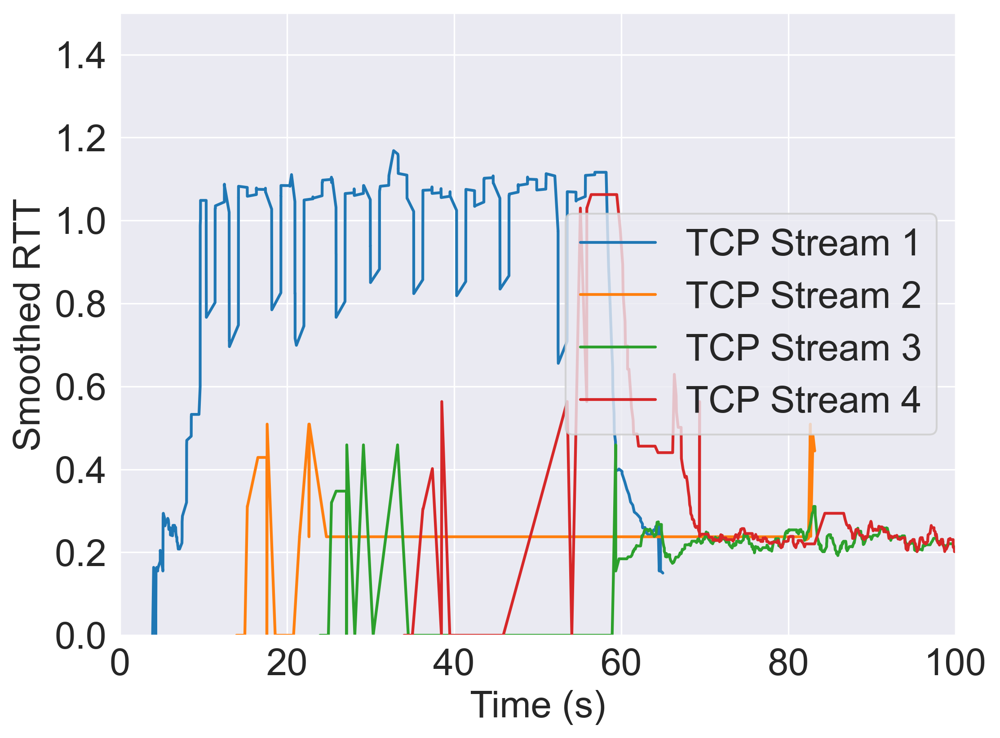

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


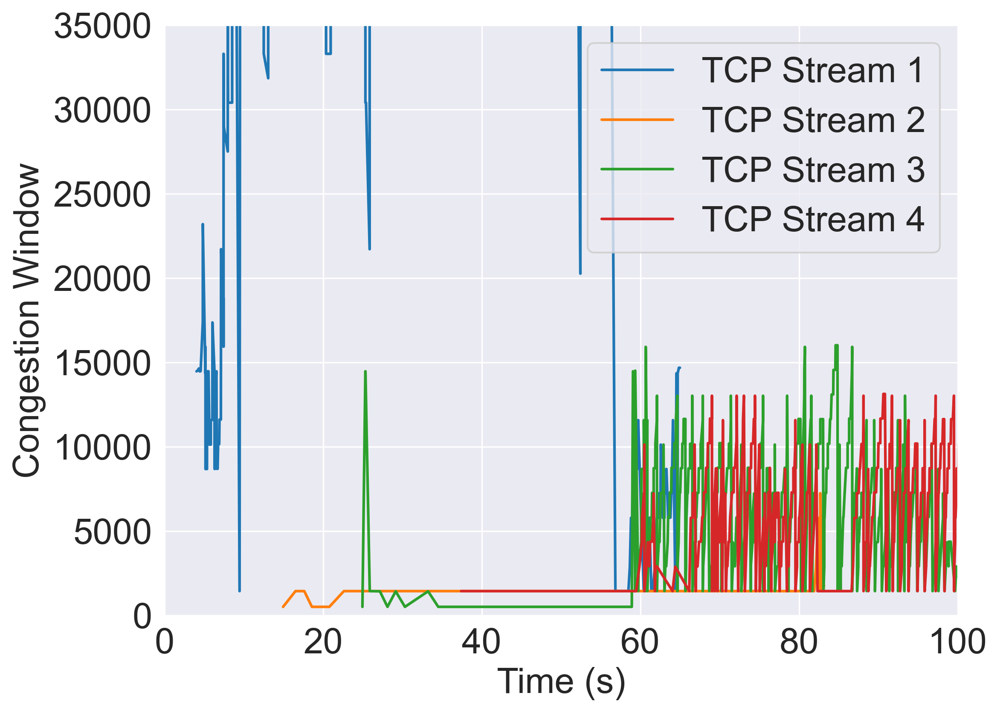

pie_1Mbps_20ms_noecn.siftr.log
count    1021.000000
mean        0.248571
std         0.041817
min         0.000000
25%         0.218125
50%         0.246250
75%         0.281562
max         0.344687
Name: SmoothedRTT, dtype: float64
2091    0.000000
2107    0.305312
2108    0.305312
2125    0.300938
2126    0.300938
Name: SmoothedRTT, dtype: float64
6424    0.273125
6425    0.273125
6434    0.252812
6436    0.252812
6437    0.252812
Name: SmoothedRTT, dtype: float64
Statistics saved to ./stats/pie_1Mbps_20ms_noecn.siftr.log_statistics_results.txt


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


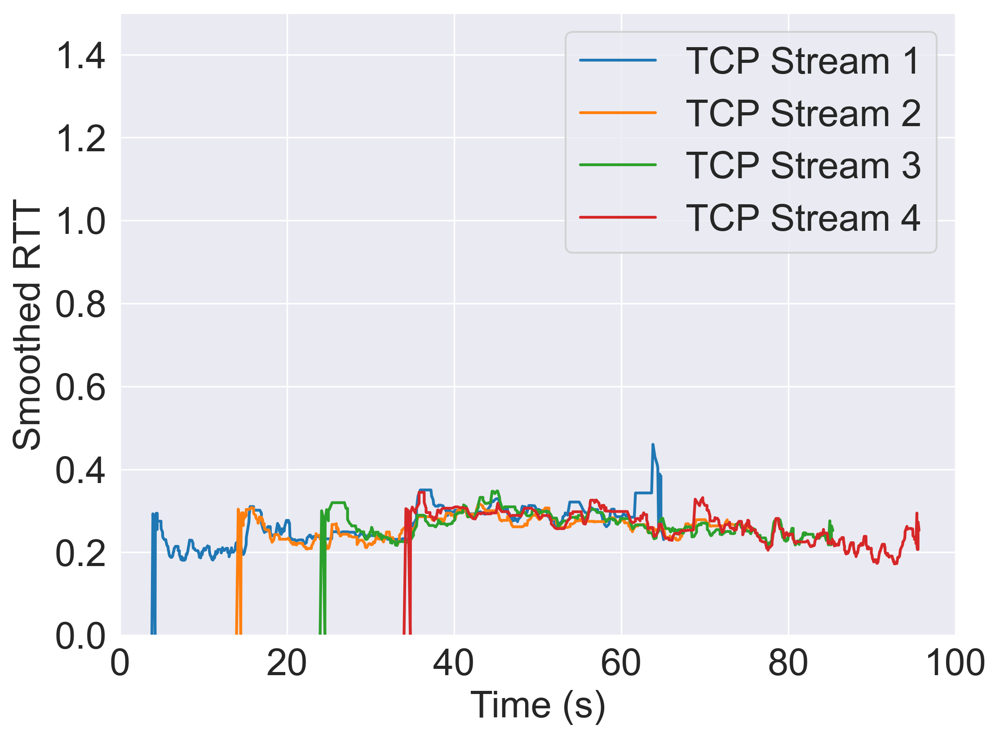

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


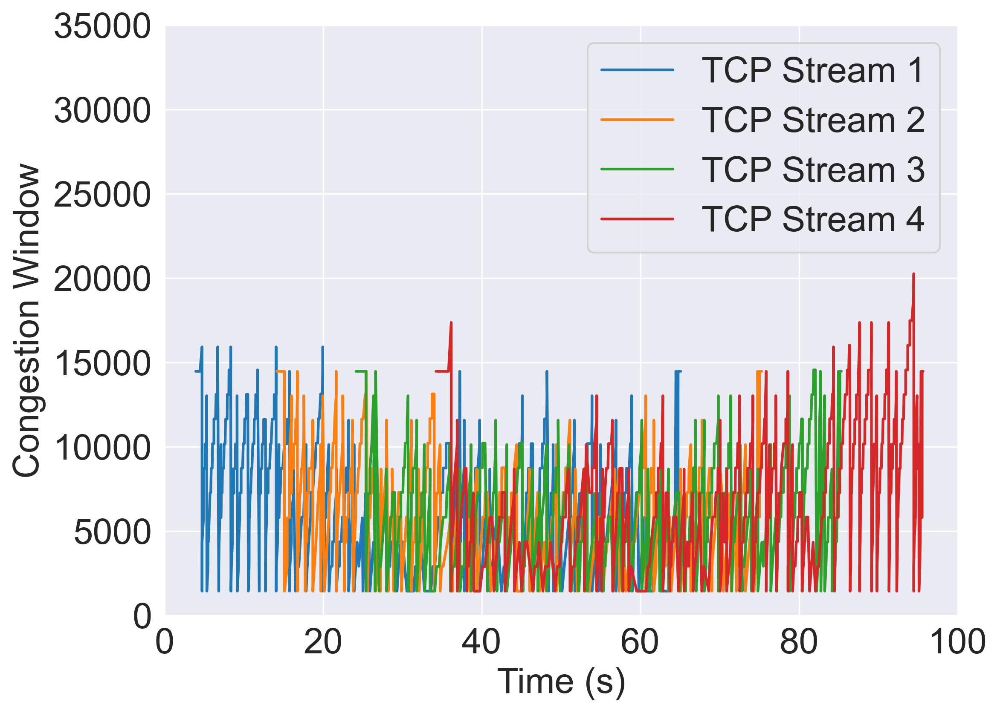

In [42]:
dataframe_list=[]
data_filename_list=[]
data_dict={}
for index in range(len(filenames)):
    # open d:/work/mptcp/twopathMPdata/test1/twopathtype1.siftr.log
    data = []
    with open("./datatest1/"+filenames[index], 'r') as f:
        # store the data
        for line in f:
            tem = re.sub(r'\s', '', line)
            data.append(tem.split(','))
    # remove file line of data
    print(filenames[index])
    data.pop(0)
    data.pop(len(data)-1)

    # define variables from enable_time_secs=1716792031	enable_time_usecs=061770	
    # siftrver=1.2.4 hz=100	tcp_rtt_scale=32	sysname=FreeBSD	sysver=1301000	ipmode=4
    enable_time_secs = 1716792031
    enable_time_usecs = 61770
    siftver = '1.2.4'
    hz = 100
    tcp_rtt_scale = 32
    sysname = 'FreeBSD'
    sysver = 1301000
    ipmode = 4



    df = pd.DataFrame(data, columns=col)

    df=df[df['Direction']=='o']

    # congestion window to int
    df = df.astype({'CongestionWindow': 'int32'})
    
    # Convert 'Time' column to float64 type
    df['Time'] = df['Time'].astype('float64')

    # Subtract the first time entry from all the entries in 'Time' column
    df['Time'] = df['Time'] - df['Time'].iloc[0]



    # remove rows that congestion window bigger than 70000
    # df = df[df['CongestionWindow'].astype(int) < 70000]
    # RTT divide by tcp_rtt_scale * hz
    df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')
    df['SmoothedRTT'] = df['SmoothedRTT'] / (tcp_rtt_scale * hz)
    df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')

    



    # first path ForeignPort = 5101
    dfPath1 = df.loc[(df['ForeignPort'] == '5101')]

    # second path localip = 5102
    dfPath2 = df.loc[(df['ForeignPort'] == '5102')]

    # third path ForeignPort = 5101
    dfPath3 = df.loc[(df['ForeignPort'] == '5103' )]

    # fourth path localip = 5102
    dfPath4 = df.loc[(df['ForeignPort'] == '5104')]
    
    # data_filename_list.append(filenames[index])
    # dataframe_list.append(dfPath1.copy())
    # data_dict[filenames[index]]=dfPath1.copy()
    print(dfPath4['SmoothedRTT'].describe())
    print(dfPath4['SmoothedRTT'].head(5))
    print(dfPath4['SmoothedRTT'].tail(5))

    # Darker color-blind-friendly palette
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
    # Different line styles and markers
    line_styles = ['-', '--', '-.', ':']
    #line_styles = ['-', '-', '-', '-']
    markers = ['o', 's', '^', 'D']

    


    

    # Plot Smoothed RTT vs Time
    #plt.figure(figsize=(7, 4.5))  # Set the figure size to fit within the column width
    plt.rcParams.update({'figure.figsize':(8,6), 'figure.dpi':300, 'font.size':20})
    sns.set_style("darkgrid")  # Set the style to darkgrid

    if "10Mbps" in filenames[index]:
        plt.xlim(0,100)
        plt.ylim(0,1)
    elif "1Mbps" in filenames[index]:
        plt.xlim(0,100)
        plt.ylim(0,1.5)
    if "fq_codel_10Mbps_20ms_ecn" in filenames[index]:
        plt.xlim(0,100)
        plt.ylim(0,2.7)
    if "fq_codel_1Mbps_20ms_ecn" in filenames[index]:
        plt.xlim(0,100)
        plt.ylim(0,4.2)

    
    # plt.plot(dfPath1['Time'], dfPath1['SmoothedRTT'], label='TCP Stream 1',
    #              color=colors[0], linestyle=line_styles[0])
    # plt.plot(dfPath2['Time'], dfPath2['SmoothedRTT'], label='TCP Stream 2',
    #              color=colors[1], linestyle=line_styles[1])
    # plt.plot(dfPath3['Time'], dfPath3['SmoothedRTT'], label='TCP Stream 3',
    #              color=colors[2], linestyle=line_styles[2])
    # plt.plot(dfPath4['Time'], dfPath4['SmoothedRTT'], label='TCP Stream 4',
    #              color=colors[3], linestyle=line_styles[3])
    # Function to calculate statistics
    def calculate_statistics(df):
        median = df['SmoothedRTT'].median()
        mean = df['SmoothedRTT'].mean()
        q25 = df['SmoothedRTT'].quantile(0.25)
        q75 = df['SmoothedRTT'].quantile(0.75)
        minimum = df['SmoothedRTT'].min()
        maximum = df['SmoothedRTT'].max()
        
        return {
            'Median': median,
            'Mean': mean,
            '25th Percentile': q25,
            '75th Percentile': q75,
            'Minimum': minimum,
            'Maximum': maximum
        }

    # Calculate statistics for each DataFrame
    statistics_dfPath1 = calculate_statistics(dfPath1)
    statistics_dfPath2 = calculate_statistics(dfPath2)
    statistics_dfPath3 = calculate_statistics(dfPath3)
    statistics_dfPath4 = calculate_statistics(dfPath4)

    # Define the filename to save results
    stats_filename = "./stats/"+filenames[index]+'_statistics_results.txt'

    # Function to save statistics to a file
    def save_statistics_to_file(stats_filename, statistics,title):
        with open(stats_filename, 'a') as f:
            f.write("Statistics for "+title+":\n")
            for key, value in statistics.items():
                f.write(f"{key}: {value}\n")
            f.write("\n")

    # Save statistics for each DataFrame to the file
    save_statistics_to_file(stats_filename, statistics_dfPath1, "TCP Stream 1")
    save_statistics_to_file(stats_filename, statistics_dfPath2, "TCP Stream 2")
    save_statistics_to_file(stats_filename, statistics_dfPath3, "TCP Stream 3")
    save_statistics_to_file(stats_filename, statistics_dfPath4, "TCP Stream 4")

    print(f"Statistics saved to {stats_filename}")
    
    plt.plot(dfPath1['Time'], dfPath1['SmoothedRTT'], label='TCP Stream 1',
                 color=colors[0])
    plt.plot(dfPath2['Time'], dfPath2['SmoothedRTT'], label='TCP Stream 2',
                 color=colors[1])
    plt.plot(dfPath3['Time'], dfPath3['SmoothedRTT'], label='TCP Stream 3',
                 color=colors[2])
    plt.plot(dfPath4['Time'], dfPath4['SmoothedRTT'], label='TCP Stream 4',
                 color=colors[3])
    
    plt.xlabel('Time (s)')
    plt.ylabel('Smoothed RTT')
    # plt.title(filenames[index])
    plt.legend()
    plt.grid(True)
    # plt.savefig("./iperf3_tests/"+title+"-"+"Graphs.png", dpi=100,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_SmoothedRTT.png", dpi=300,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_SmoothedRTT.eps", dpi=300,bbox_inches='tight')
    plt.show()

    dfpath1_filtered = remove_outliers_iqr(dfPath1,"CongestionWindow")
    dfpath2_filtered = remove_outliers_iqr(dfPath2,"CongestionWindow")
    dfpath3_filtered = remove_outliers_iqr(dfPath3,"CongestionWindow")
    dfpath4_filtered = remove_outliers_iqr(dfPath4,"CongestionWindow")

    # Plot CWND vs Time
    #plt.figure(figsize=(7, 4.5))  # Set the figure size to fit within the column width
    plt.rcParams.update({'figure.figsize':(8,6), 'figure.dpi':300, 'font.size':20})
    sns.set_style("darkgrid")  # Set the style to darkgrid


    # if contains_1_or_2(filenames[index]) == 1:
    #     plt.xlim(0,100)
    #     plt.ylim(0,140000)
    # elif contains_1_or_2(filenames[index]) == 2:
    #     plt.xlim(0,100)
    #     plt.ylim(0,140000)

    if "10Mbps" in filenames[index]:
        plt.xlim(0,100)
        plt.ylim(0,180000)
    elif "1Mbps" in filenames[index]:
        plt.xlim(0,100)
        plt.ylim(0,35000)
    

    
   
    # plt.plot(dfpath1_filtered['Time'], dfpath1_filtered['CongestionWindow'], label='TCP Stream 1',
    #              color=colors[0], linestyle=line_styles[0])
    # plt.plot(dfpath2_filtered['Time'], dfpath2_filtered['CongestionWindow'], label='TCP Stream 2',
    #              color=colors[1], linestyle=line_styles[1])
    # plt.plot(dfpath3_filtered['Time'], dfpath3_filtered['CongestionWindow'], label='TCP Stream 3',
    #              color=colors[2], linestyle=line_styles[2])
    # plt.plot(dfpath4_filtered['Time'], dfpath4_filtered['CongestionWindow'], label='TCP Stream 4',
    #              color=colors[3], linestyle=line_styles[3])
    

    plt.plot(dfpath1_filtered['Time'], dfpath1_filtered['CongestionWindow'], label='TCP Stream 1',
                 color=colors[0])
    plt.plot(dfpath2_filtered['Time'], dfpath2_filtered['CongestionWindow'], label='TCP Stream 2',
                 color=colors[1])
    plt.plot(dfpath3_filtered['Time'], dfpath3_filtered['CongestionWindow'], label='TCP Stream 3',
                 color=colors[2])
    plt.plot(dfpath4_filtered['Time'], dfpath4_filtered['CongestionWindow'], label='TCP Stream 4',
                 color=colors[3])
    
    plt.xlabel('Time (s)')
    plt.ylabel('Congestion Window')
    # plt.title(filenames[index])
    plt.legend()
    plt.grid(True)
    # plt.savefig("./iperf3_tests/"+title+"-"+"Graphs.png", dpi=100,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_CWND.png", dpi=300,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_CWND.eps", dpi=300,bbox_inches='tight')
    plt.show()
    


In [43]:
# dataframe_list=[]
# data_filename_list=[]
# data_dict={}
# for index in range(len(filenames)):
#     # open d:/work/mptcp/twopathMPdata/test1/twopathtype1.siftr.log
#     data = []
#     with open("./datatest1/"+filenames[index], 'r') as f:
#         # store the data
#         for line in f:
#             tem = re.sub(r'\s', '', line)
#             data.append(tem.split(','))
#     # remove file line of data
#     data.pop(0)
#     data.pop(len(data)-1)

#     # define variables from enable_time_secs=1716792031	enable_time_usecs=061770	
#     # siftrver=1.2.4 hz=100	tcp_rtt_scale=32	sysname=FreeBSD	sysver=1301000	ipmode=4
#     enable_time_secs = 1716792031
#     enable_time_usecs = 61770
#     siftver = '1.2.4'
#     hz = 100
#     tcp_rtt_scale = 32
#     sysname = 'FreeBSD'
#     sysver = 1301000
#     ipmode = 4



#     df = pd.DataFrame(data, columns=col)

#     # congestion window to int
#     df = df.astype({'CongestionWindow': 'int32'})
    
#     # Convert 'Time' column to float64 type
#     df['Time'] = df['Time'].astype('float64')

#     # Subtract the first time entry from all the entries in 'Time' column
#     df['Time'] = df['Time'] - df['Time'].iloc[0]



#     # remove rows that congestion window bigger than 70000
#     # df = df[df['CongestionWindow'].astype(int) < 70000]
#     # RTT divide by tcp_rtt_scale * hz
#     df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')
#     df['SmoothedRTT'] = df['SmoothedRTT'] / (tcp_rtt_scale * hz)
#     df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')



#     # first path ForeignPort = 5101
#     dfPath1 = df.loc[(df['ForeignPort'] == '5101')]

#     # second path localip = 5102
#     dfPath2 = df.loc[(df['ForeignPort'] == '5102')]

#     # third path ForeignPort = 5101
#     dfPath3 = df.loc[(df['ForeignPort'] == '5103' )]

#     # fourth path localip = 5102
#     dfPath4 = df.loc[(df['ForeignPort'] == '5104')]
    
#     # data_filename_list.append(filenames[index])
#     # dataframe_list.append(dfPath1.copy())
#     # data_dict[filenames[index]]=dfPath1.copy()
#     print(dfPath4['SmoothedRTT'].describe())
#     print(dfPath4['SmoothedRTT'].head(5))
#     print(dfPath4['SmoothedRTT'].tail(5))


    

#     # Plot Smoothed RTT vs Time
#     plt.figure(figsize=(10, 6))
#     plt.plot(dfPath1['Time'], dfPath1['SmoothedRTT'], label='TCP Stream 1')
#     plt.plot(dfPath2['Time'], dfPath2['SmoothedRTT'], label='TCP Stream 2')
#     plt.plot(dfPath3['Time'], dfPath3['SmoothedRTT'], label='TCP Stream 3')
#     plt.plot(dfPath4['Time'], dfPath4['SmoothedRTT'], label='TCP Stream 4')
#     plt.xlabel('Time (s)')
#     plt.ylabel('Smoothed RTT')
#     plt.title(filenames[index])
#     plt.legend()
#     plt.grid(True)
#     plt.show()

#     # Plot CWND vs Time
#     plt.figure(figsize=(10, 6))
#     plt.plot(dfPath1['Time'], dfPath1['CongestionWindow'], label='TCP Stream 1')
#     plt.plot(dfPath2['Time'], dfPath2['CongestionWindow'], label='TCP Stream 2')
#     plt.plot(dfPath3['Time'], dfPath3['CongestionWindow'], label='TCP Stream 3')
#     plt.plot(dfPath4['Time'], dfPath4['CongestionWindow'], label='TCP Stream 4')
#     plt.xlabel('Time (s)')
#     plt.ylabel('Congestion Window')
#     plt.title(filenames[index])
#     plt.legend()
#     plt.grid(True)
#     plt.show()

    
#     break;
    


In [44]:
for i in range(len(col)):
    print(i,end=",")
    print(col[i])


0,Direction
1,Hash
2,Time
3,LocalIP
4,LocalPort
5,ForeignIP
6,ForeignPort
7,SlowStartThreshold
8,CongestionWindow
9,BandwidthControlledWindow
10,SendingWindow
11,ReceiveWindow
12,SendingWindowScalingFactor
13,ReceiveWindowScalingFactor
14,TCPFiniteStateMachine
15,MaximumSegmentSize
16,SmoothedRTT
17,SACKEnabled
18,TCPFlags
19,RetransmissionTimeout
20,SocketSendBufferSize
21,SocketSendBufferBytes
22,SocketReceiveBufferSize
23,SocketReceiveBufferBytes
24,UnacknowledgedBytes
25,ReassemblyQueue
26,Flowid
27,Flowtype
